# Find out what genes were included in HVGs

In [1]:
# load packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)
library(RColorBrewer)
library(gplots)
library(viridis)
library(tidyr)
library(gridExtra)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘gplots’


The following object is masked from ‘package:stats’:

    lowess


Loading required package: viridisLite


Attaching package: ‘tidyr’


The following objects are masked from ‘package:Matrix’:

    expand, pack, unpack


The following object is masked from ‘package:magrittr’:

    extract



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




In [2]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] gridExtra_2.3      tidyr_1.1.2        viridis_0.5.1      viridisLite_0.3.0 
 [5] gplots_3.1.1       RColorBrewer_1.1-2 tibble_3.0.5       dplyr_1.0.3       
 [9] Matrix_1.3-2       data.table_1.13.6  magrittr_2.0.1     ggplot2_3.3.3     
[13] Seurat_3.2.3      

loaded via a namespace (and not attached):
 [1] nlme_3.1-151          bitops_1.0-6          matrixStats_0.57.0   
 [4] RcppAnnoy_0.0.18      httr_1.4.2            repr_1.1.0           
 [7] sctransform_0.3.2     tools_4.0.3       

In [3]:
# loading data
seu_HQC <- readRDS(file = '../../data/seurat_object/Set3/seu_HQC_subclusterd2_Set3.obj')

## Preprocessing

In [4]:
is.gal4 <- grepl(pattern = 'GAL4', x = rownames(seu_HQC))
is.mCherry <- grepl(pattern = 'mCherry', x = rownames(seu_HQC))
is.to.remove <- is.gal4|is.mCherry
sum(is.to.remove)

[1] 2

In [5]:
seu_HQC <- seu_HQC[!is.to.remove,]
seu_HQC

An object of class Seurat 
22474 features across 6118 samples within 2 assays 
Active assay: SCT (11237 features, 2998 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


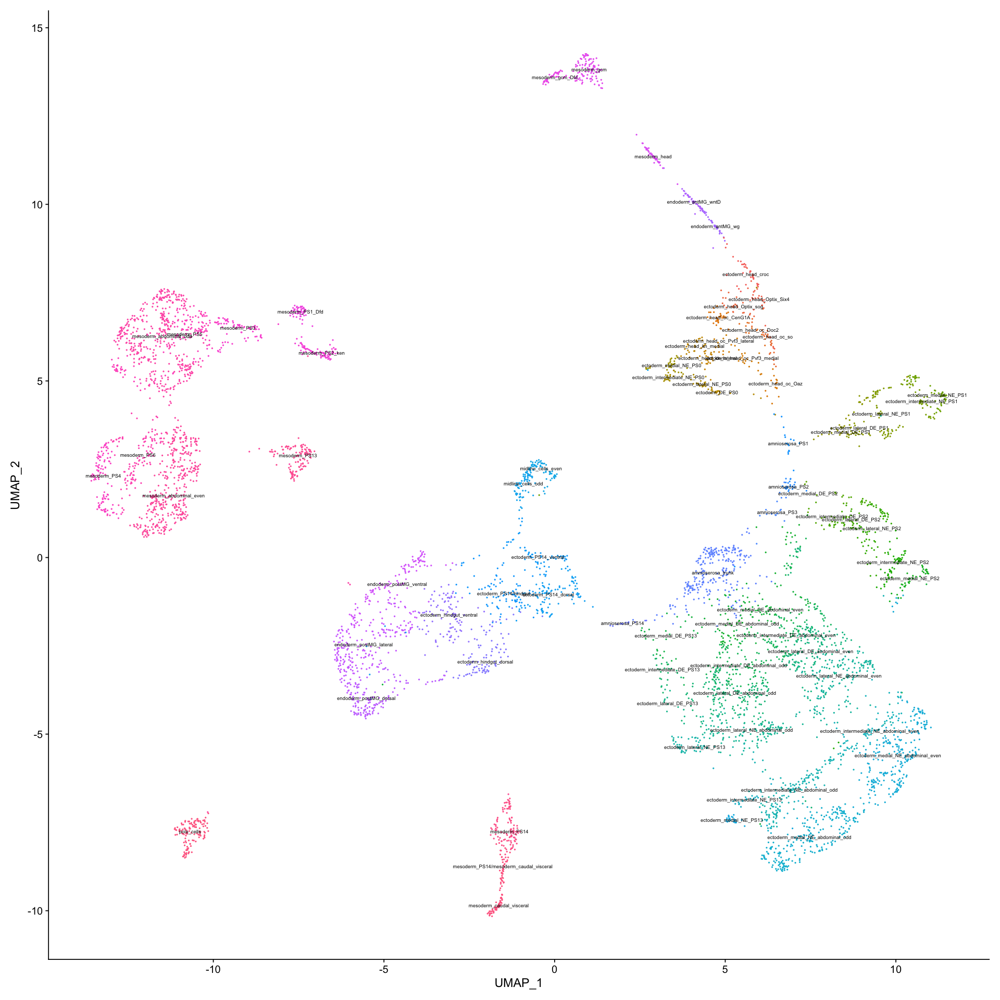

In [6]:
options(repr.plot.width=16, repr.plot.height=16)
DimPlot(seu_HQC, reduction = 'umap', label.size = 2,label = T) + NoLegend()

In [7]:
seu_HQC_woPC <- subset(seu_HQC,idents = ('pole_cells'), invert = T)
seu_HQC_woPC

An object of class Seurat 
22474 features across 5995 samples within 2 assays 
Active assay: SCT (11237 features, 2998 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

In [8]:
#Re-normalize without Pole cells
DefaultAssay(seu_HQC_woPC) <- "RNA"
seu_HQC_woPC <- suppressWarnings(SCTransform(seu_HQC_woPC, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

In [9]:
seu_HQC_woPC

An object of class Seurat 
22410 features across 5995 samples within 2 assays 
Active assay: SCT (11173 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

## Get HVGs list

In [10]:
glad.table <- read.table('../../GLAD/conversion_list_with_modified_GLAD_rm_intracellular_organella.tsv', sep = '\t', header = 1, quote = NULL, na.strings = 'NNNNN')
row.names(glad.table) <- glad.table$BDGP_ref_symbol
glad.table <- transform(glad.table, Modified_GLAD = factor(Modified_GLAD, levels = c('PM-related','others','Not in GLAD','TF')))

<!-- To remove 
GO:0043231 intracellular membrane-bounded organelle  
Flybaseの"Records annotated with this term OR any of its CHILD TERMS"  
から遺伝子リストを取得した  
（Child termにはmitochondrion, Golgi apparatus, endoplasmic reticulumを含む）  
PM-relatedからはこれに含まれる遺伝子を除去してある

[http://flybase.org/cgi-bin/cvreport.pl?id=GO%3A0043231](http://flybase.org/cgi-bin/cvreport.pl?id=GO%3A0043231) -->

In [11]:
vf.3000 <- VariableFeatures(seu_HQC_woPC)
#Conversion from gene symbol to Flybase ID
vf.3000.fbgn <- glad.table$id_in_Flybase[glad.table$BDGP_ref_symbol %in% vf.3000]
head(vf.3000.fbgn)
length(vf.3000.fbgn)

[1] "FBgn0260470" "FBgn0053995" "FBgn0266450" "FBgn0003313" "FBgn0259201"
[6] "FBgn0051976"

[1] 3000

In [12]:
write(x = vf.3000.fbgn, file = 'VF3000_FBgn.txt') #Write ID list of HVGs into txt

## GO term enrichment analysis

In [13]:
#loading results of GO term enrichment analysis
enrichment.res <- read.csv(file = './gProfiler_dmelanogaster_2022-11-7 17-56-30__intersections.csv')
head(enrichment.res)

,source,term_name,term_id,adjusted_p_value,negative_log10_of_adjusted_p_value,term_size,query_size,intersection_size,effective_domain_size,intersections
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<chr>
1,GO:MF,DNA-binding transcription factor activity,GO:0003700,9.610540e-44,43.01725,574,2289,256,11908,"FBGN0266450,FBGN0283521,FBGN0035357,FBGN0000014,FBGN0000015,FBGN0000022,FBGN0000028,FBGN0000061,FBGN0000097,FBGN0000157,FBGN0000179,FBGN0000233,FBGN0000251,FBGN0000287,FBGN0000411,FBGN0000439,FBGN0000492,FBGN0000546,FBGN0000568,FBGN0000576,FBGN0000577,FBGN0000591,FBGN0000606,FBGN0000659,FBGN0001077,FBGN0001138,FBGN0001147,FBGN0001148,FBGN0001150,FBGN0001168,FBGN0001180,FBGN0001235,FBGN0001269,FBGN0001297,FBGN0001319,FBGN0001320,FBGN0001323,FBGN0001325,FBGN0002522,FBGN0002561,FBGN0002573,FBGN0002609,FBGN0002631,FBGN0002633,FBGN0002723,FBGN0002733,FBGN0002734,FBGN0002735,FBGN0002931,FBGN0002941,FBGN0002985,FBGN0003002,FBGN0003028,FBGN0003044,FBGN0003053,FBGN0003117,FBGN0003118,FBGN0003130,FBGN0003145,FBGN0003254,FBGN0003267,FBGN0003270,FBGN0003300,FBGN0003339,FBGN0003345,FBGN0003396,FBGN0003411,FBGN0003430,FBGN0003448,FBGN0003460,FBGN0003499,FBGN0003507,FBGN0003513,FBGN0003567,FBGN0003651,FBGN0003720,FBGN0003862,FBGN0003866,FBGN0003870,FBGN0003896,FBGN0003900,FBGN0003944,FBGN0004053,FBGN0004054,FBGN0004102,FBGN0004110,FBGN0004170,FBGN0004198,FBGN0004394,FBGN0004396,FBGN0004567,FBGN0004595,FBGN0004606,FBGN0004607,FBGN0004656,FBGN0004666,FBGN0004795,FBGN0004837,FBGN0004854,FBGN0004859,FBGN0004862,FBGN0004863,FBGN0004878,FBGN0004880,FBGN0004892,FBGN0004893,FBGN0004895,FBGN0004898,FBGN0005427,FBGN0005612,FBGN0005658,FBGN0008636,FBGN0010109,FBGN0010323,FBGN0010433,FBGN0010768,FBGN0011236,FBGN0011278,FBGN0011656,FBGN0011723,FBGN0011758,FBGN0011766,FBGN0013469,FBGN0013751,FBGN0014143,FBGN0014179,FBGN0014343,FBGN0014859,FBGN0015371,FBGN0015396,FBGN0015524,FBGN0015550,FBGN0015561,FBGN0015903,FBGN0015904,FBGN0015919,FBGN0016076,FBGN0016660,FBGN0016694,FBGN0016917,FBGN0019650,FBGN0019809,FBGN0020294,FBGN0020307,FBGN0020378,FBGN0020493,FBGN0020617,FBGN0020912,FBGN0021872,FBGN0022740,FBGN0023214,FBGN0024184,FBGN0024244,FBGN0024250,FBGN0024321,FBGN0025360,FBGN0025525,FBGN0025776,FBGN0026411,FBGN0026575,FBGN0027364,FBGN0028550,FBGN0028789,FBGN0028979,FBGN0287186,FBGN0028996,FBGN0028999,FBGN0029123,FBGN0029504,FBGN0029939,FBGN0030058,FBGN0030417,FBGN0030505,FBGN0031375,FBGN0031894,FBGN0032197,FBGN0032493,FBGN0032651,FBGN0032694,FBGN0033010,FBGN0033458,FBGN0033782,FBGN0034240,FBGN0035160,FBGN0035625,FBGN0035954,FBGN0035956,FBGN0036411,FBGN0036522,FBGN0037085,FBGN0037120,FBGN0037475,FBGN0037619,FBGN0037698,FBGN0038197,FBGN0038391,FBGN0038833,FBGN0039039,FBGN0039078,FBGN0039209,FBGN0039283,FBGN0039286,FBGN0039411,FBGN0039683,FBGN0039808,FBGN0039937,FBGN0040318,FBGN0040765,FBGN0041156,FBGN0043364,FBGN0045759,FBGN0045852,FBGN0050431,FBGN0051481,FBGN0052767,FBGN0053196,FBGN0083981,FBGN0085253,FBGN0085396,FBGN0085424,FBGN0085432,FBGN0085450,FBGN0086680,FBGN0259176,FBGN0259211,FBGN0259789,FBGN0259938,FBGN0260642,FBGN0261238,FBGN0261283,FBGN0261434,FBGN0261647,FBGN0261648,FBGN0261703,FBGN0261705,FBGN0261793,FBGN0261930,FBGN0261953,FBGN0261963,FBGN0262582,FBGN0262636,FBGN0262656,FBGN0262975,FBGN0263112,FBGN0263239,FBGN0263490,FBGN0263511,FBGN0264005,FBGN0264442,FBGN0264562,FBGN0265276,FBGN0266083,FBGN0267336,FBGN0267792,FBGN0286204,FBGN0283451"
2,GO:MF,"DNA-binding transcription factor activity, RNA polymerase II-specific",GO:0000981,4.215253e-42,41.37518,498,2289,230,11908,"FBGN0035357,FBGN0000014,FBGN0000015,FBGN0000022,FBGN0000028,FBGN0000061,FBGN0000097,FBGN0000157,FBGN0000179,FBGN0000233,FBGN0000251,FBGN0000287,FBGN0000411,FBGN0000439,FBGN0000492,FBGN0000546,FBGN0000568,FBGN0000576,FBGN0000577,FBGN0000591,FBGN0000606,FBGN0000659,FBGN0001077,FBGN0001138,FBGN0001147,FBGN0001148,FBGN0001150,FBGN0001168,FBGN0001180,FBGN0001235,FBGN0001269,FBGN0001297,FBGN0001319,FBGN0001320,FBGN0001323,FBGN0001325,FBGN0002522,FBGN0002561,FBGN0002573,FBGN00026

In [14]:
enrichment.res.gocc <- enrichment.res[enrichment.res$source == 'GO:CC',]
enrichment.res.gocc <- transform(enrichment.res.gocc, term_name = factor(term_name, levels = rev(enrichment.res.gocc$term_name)))
head(enrichment.res.gocc)

source term_name                  term_id    adjusted_p_value
574 GO:CC  cell periphery             GO:0071944 8.108714e-29    
575 GO:CC  plasma membrane            GO:0005886 1.607698e-27    
576 GO:CC  anchoring junction         GO:0070161 2.846348e-21    
577 GO:CC  apical part of cell        GO:0045177 3.026734e-19    
578 GO:CC  cellular anatomical entity GO:0110165 4.153034e-19    
579 GO:CC  cell-cell junction         GO:0005911 9.410964e-18    
    negative_log10_of_adjusted_p_value term_size query_size intersection_size
574 28.09105                            2121     2343        611             
575 26.79380                            1720     2343        514             
576 20.54571                             175     2343         93             
577 18.51903                             193     2343         96             
578 18.38163                           10552     2343       2178             
579 17.02637                             135     2343         74             
    effective_domain_size
574 12063                
575 12063                
576 12063                
577 12063                
578 12063                
579 12063                
    intersections                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

Saving 7 x 7 in image



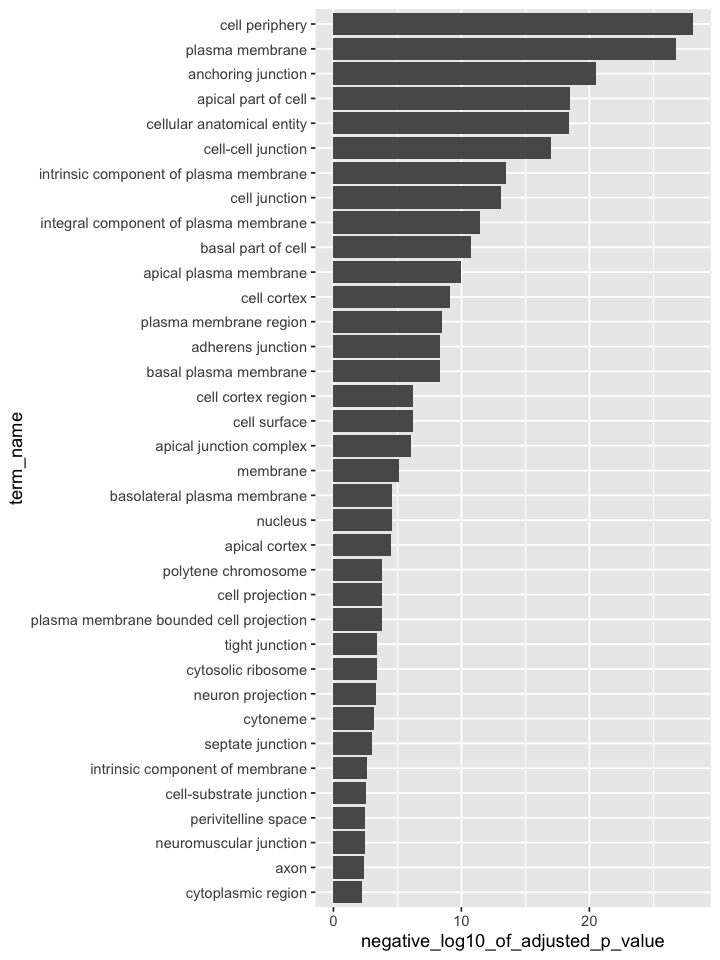

In [15]:
options(repr.plot.width=6, repr.plot.height=8)
g <- ggplot(enrichment.res.gocc, aes(x = term_name, y = negative_log10_of_adjusted_p_value))
g <- g + geom_col()
g <- g + coord_flip()
g
ggsave(g, file = "./figures/GOterm_3000VFs.eps", dpi = 300)

## GLAD category enrichment analysis

In [16]:
vf.list <- VariableFeatures(seu_HQC_woPC)

In [17]:
glad.table.vf <- glad.table[vf.list,]
glad.table.vf$rank <- 1:3000
head(glad.table.vf)
glad.table.detected <- glad.table[row.names(seu_HQC_woPC),]
head(glad.table.vf)
dim(glad.table.detected)

,id_in_Flybase,symbol_in_Flybase,BDGP_ref_id,BDGP_ref_symbol,GO_term_analysis,in_GRAD_db,in_BDGP_gtf,Modified_GLAD,rank
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<int>
sog,FBgn0003463,sog,FBgn0003463,sog,True,in_GRAD_db,in_BDGP_gtf,PM-related,1
peb,FBgn0003053,peb,FBgn0003053,peb,True,in_GRAD_db,in_BDGP_gtf,TF,2
CG13653,FBgn0039288,CG13653,FBgn0039288,CG13653,True,in_GRAD_db,in_BDGP_gtf,Not in GLAD,3
Abd-B,FBgn0000015,Abd-B,FBgn0000015,Abd-B,True,in_GRAD_db,in_BDGP_gtf,TF,4
E(spl)m7-HLH,FBgn0002633,E(spl)m7-HLH,FBgn0002633,E(spl)m7-HLH,True,in_GRAD_db,in_BDGP_gtf,TF,5
disco,FBgn0000459,disco,FBgn0000459,disco,True,in_GRAD_db,in_BDGP_gtf,TF,6


,id_in_Flybase,symbol_in_Flybase,BDGP_ref_id,BDGP_ref_symbol,GO_term_analysis,in_GRAD_db,in_BDGP_gtf,Modified_GLAD,rank
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<int>
sog,FBgn0003463,sog,FBgn0003463,sog,True,in_GRAD_db,in_BDGP_gtf,PM-related,1
peb,FBgn0003053,peb,FBgn0003053,peb,True,in_GRAD_db,in_BDGP_gtf,TF,2
CG13653,FBgn0039288,CG13653,FBgn0039288,CG13653,True,in_GRAD_db,in_BDGP_gtf,Not in GLAD,3
Abd-B,FBgn0000015,Abd-B,FBgn0000015,Abd-B,True,in_GRAD_db,in_BDGP_gtf,TF,4
E(spl)m7-HLH,FBgn0002633,E(spl)m7-HLH,FBgn0002633,E(spl)m7-HLH,True,in_GRAD_db,in_BDGP_gtf,TF,5
disco,FBgn0000459,disco,FBgn0000459,disco,True,in_GRAD_db,in_BDGP_gtf,TF,6


[1] 11173     8

In [18]:
sum(glad.table$BDGP_ref_symbol == 'nan')

[1] 1

Saving 7 x 7 in image



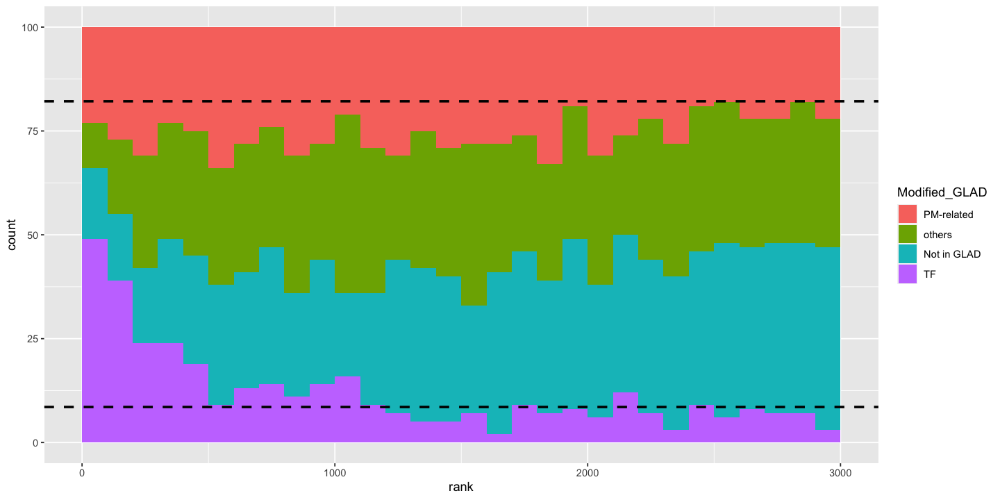

In [19]:
options(repr.plot.width=12, repr.plot.height=6)

binsize = 100
number.of.category <- dim(glad.table.detected[glad.table.detected$Modified_GLAD == 'TF',])[1]
# tot.num <- dim(glad.table)[1]
tot.num <- dim(glad.table.detected)[1]
rand.line.tf = number.of.category/tot.num * binsize

number.of.category <- dim(glad.table.detected[glad.table.detected$Modified_GLAD == 'PM-related',])[1]
# tot.num <- dim(glad.table)[1]
tot.num <- dim(glad.table.detected)[1]
rand.line.pm = binsize - number.of.category/tot.num * binsize

g <- ggplot(glad.table.vf, aes(x = rank, fill = Modified_GLAD))
g <- g + geom_histogram(breaks = seq(0,3000,binsize))
g <- g + geom_hline(yintercept=c(rand.line.tf,rand.line.pm), linetype="dashed", 
                color = "black", size=1)
g
ggsave(g, file = "./figures/GLAD_categories_rank.eps", dpi = 300)

[1] 8.547391

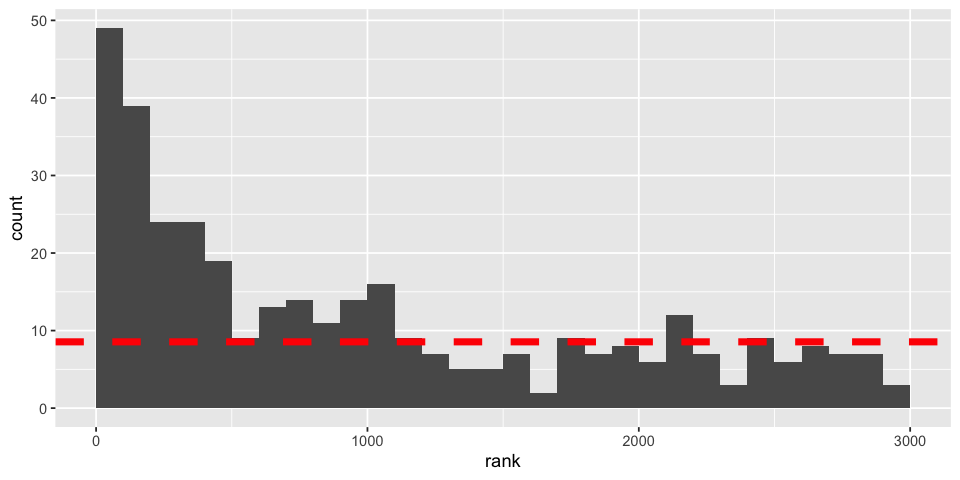

In [20]:
options(repr.plot.width=8, repr.plot.height=4)
binsize = 100
number.of.category <- dim(glad.table.detected[glad.table.detected$Modified_GLAD == 'TF',])[1]
# tot.num <- dim(glad.table)[1]
tot.num <- dim(glad.table.detected)[1]
rand.line = number.of.category/tot.num * binsize
rand.line
g <- ggplot(glad.table.vf[glad.table.vf$Modified_GLAD == 'TF',], aes(x = rank))
g <- g + geom_histogram(breaks = seq(0,3000,binsize))
g <- g + geom_hline(yintercept=rand.line, linetype="dashed", 
                color = "red", size=2)
plot(g)

[1] 17.85554

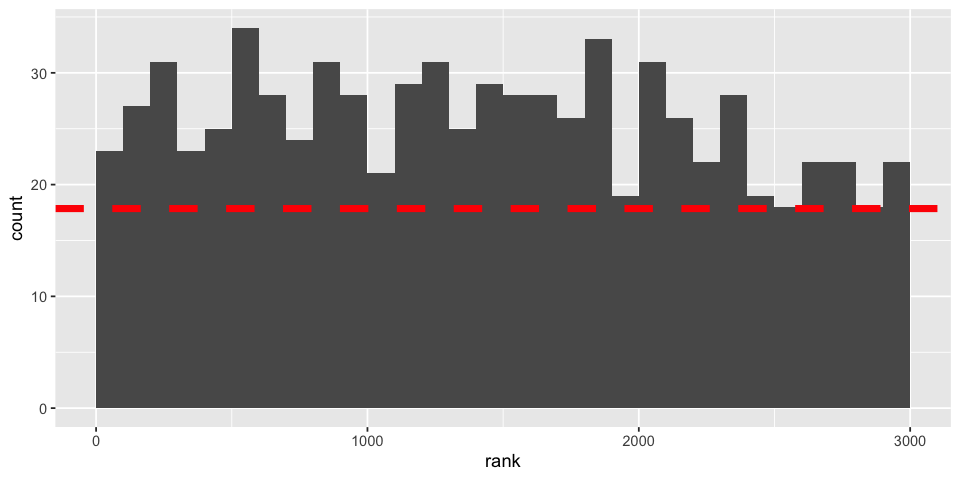

In [21]:
options(repr.plot.width=8, repr.plot.height=4)
binsize = 100
number.of.category <- dim(glad.table.detected[glad.table.detected$Modified_GLAD == 'PM-related',])[1]
tot.num <- dim(glad.table.detected)[1]
rand.line = number.of.category/tot.num * binsize
rand.line
g <- ggplot(glad.table.vf[glad.table.vf$Modified_GLAD == 'PM-related',], aes(x = rank))
g <- g + geom_histogram(breaks = seq(0,3000,binsize))
g <- g + geom_hline(yintercept=rand.line, linetype="dashed", 
                color = "red", size=2)
plot(g)

[1] 33.95686

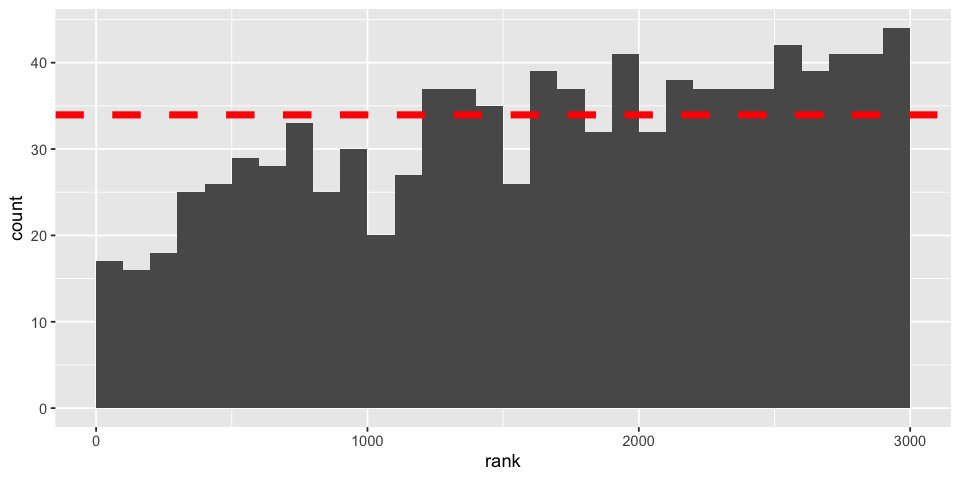

In [22]:
options(repr.plot.width=8, repr.plot.height=4)
binsize = 100
number.of.category <- dim(glad.table.detected[glad.table.detected$Modified_GLAD == 'Not in GLAD',])[1]
tot.num <- dim(glad.table.detected)[1]
rand.line = number.of.category/tot.num * binsize
rand.line
g <- ggplot(glad.table.vf[glad.table.vf$Modified_GLAD == 'Not in GLAD',], aes(x = rank))
g <- g + geom_histogram(breaks = seq(0,3000,binsize))
g <- g + geom_hline(yintercept=rand.line, linetype="dashed", 
                color = "red", size=2)
plot(g)

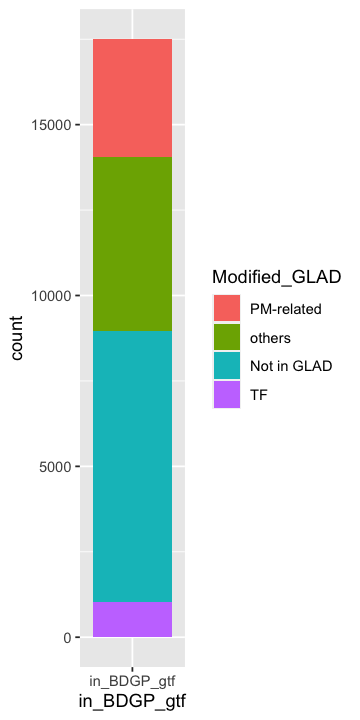

In [23]:
#in whole genome
glad.table$rank = 1:dim(glad.table)[1]
options(repr.plot.width=3, repr.plot.height=6)
g <- ggplot(glad.table, aes(x = in_BDGP_gtf, fill = Modified_GLAD))
g <- g + geom_bar()
g
ggsave(g, file = "./figures/GLAD_categories_whole_genome.eps", dpi = 300, width = 3, height = 6)

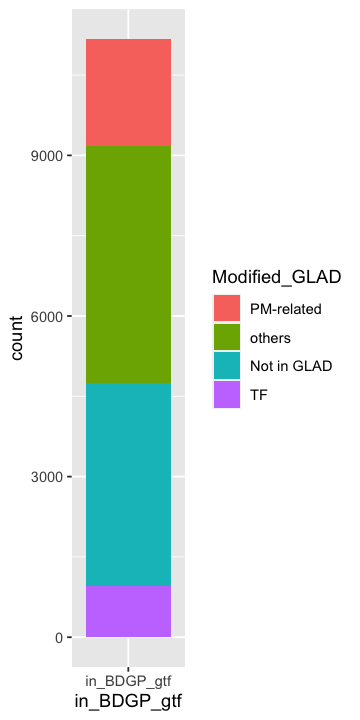

In [24]:
#in the detected genes
glad.table$rank = 1:dim(glad.table)[1]
options(repr.plot.width=3, repr.plot.height=6)
g <- ggplot(glad.table.detected, aes(x = in_BDGP_gtf, fill = Modified_GLAD))
g <- g + geom_bar()
g
ggsave(g, file = "./figures/GLAD_categories_detected.eps", dpi = 300, width = 3, height = 6)

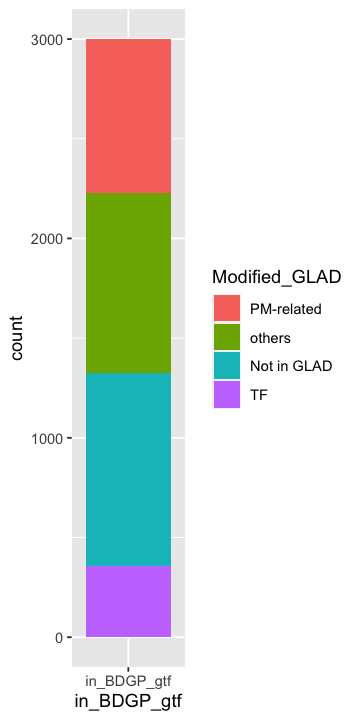

In [25]:
# in all vf
options(repr.plot.width=3, repr.plot.height=6)
g <- ggplot(glad.table.vf, aes(x = in_BDGP_gtf,fill = Modified_GLAD))
g <- g + geom_bar()
g
ggsave(g, file = "./figures/GLAD_categories_3000VFs.eps", dpi = 300, width = 3, height = 6)

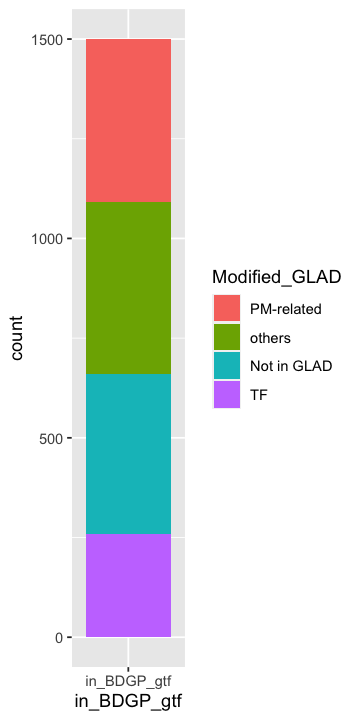

In [26]:
# in 1500 vfs
options(repr.plot.width=3, repr.plot.height=6)
g <- ggplot(glad.table.vf[1:1500,], aes(x = in_BDGP_gtf,fill = Modified_GLAD))
g <- g + geom_bar()
g
ggsave(g, file = "./figures/GLAD_categories_1500VFs.eps", dpi = 300, width = 3, height = 6)

TableGrob (1 x 13) "arrange": 4 grobs
  z         cells    name           grob
1 1 ( 1- 1, 1-10) arrange gtable[layout]
2 2 ( 1- 1,11-11) arrange gtable[layout]
3 3 ( 1- 1,12-12) arrange gtable[layout]
4 4 ( 1- 1,13-13) arrange gtable[layout]

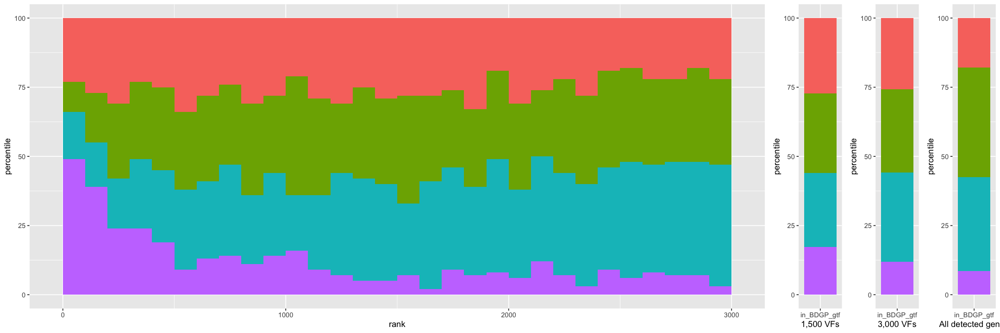

In [27]:
options(repr.plot.width=18, repr.plot.height=6)

binsize = 100
number.of.category <- dim(glad.table.detected[glad.table.detected$Modified_GLAD == 'TF',])[1]
tot.num <- dim(glad.table.detected)[1]
rand.line.tf = number.of.category/tot.num * binsize

number.of.category <- dim(glad.table.detected[glad.table.detected$Modified_GLAD == 'PM-related',])[1]
tot.num <- dim(glad.table.detected)[1]
rand.line.pm = binsize - number.of.category/tot.num * binsize

g <- ggplot(glad.table.vf, aes(x = rank, fill = Modified_GLAD))
g <- g + geom_histogram(breaks = seq(0,3000,binsize))

g <- g + NoLegend()
g <- g + ylab('percentile')

# in all vf

g1 <- ggplot(glad.table.vf, aes(x = in_BDGP_gtf,fill = Modified_GLAD))
g1 <- g1 + geom_bar()
# rand.line.tf <- rand.line.tf * (3000/binsize)
# rand.line.pm <- 3000 - (binsize - rand.line.pm) * (3000/binsize)
g1 <- g1 + NoLegend()
g1 <- g1 + scale_y_continuous(breaks = c(0,1,2,3,4)*3000/4.0, labels = c(0,25,50,75,100))
g1 <- g1 + ylab('percentile')
g1 <- g1 + xlab('3,000 VFs')

# in 1500 HVGs

g2 <- ggplot(glad.table.vf[1:1500,], aes(x = in_BDGP_gtf,fill = Modified_GLAD))
g2 <- g2 + geom_bar() 
g2 <- g2 + NoLegend()
g2 <- g2 + scale_y_continuous(breaks = c(0,1,2,3,4)*1500/4.0, labels = c(0,25,50,75,100))
g2 <- g2 + ylab('percentile')
g2 <- g2 + xlab('1,500 VFs')


#in the detected genes
g3 <- ggplot(glad.table.detected, aes(x = in_BDGP_gtf, fill = Modified_GLAD))
g3 <- g3 + geom_bar()
g3 <- g3 + NoLegend()
g3 <- g3 + scale_y_continuous(breaks = c(0,1,2,3,4)*dim(glad.table.detected)[1]/4.0, labels = c(0,25,50,75,100))
g3 <- g3 + ylab('percentile')
g3 <- g3 + xlab('All detected genes')

l <- rbind(c(1,1,1,1,1,1,1,1,1,1,2,3,4))
fig <- grid.arrange(g,g2,g1,g3,layout_matrix = l) #rank, 1500VFs, 3000VFs, detected genes
fig
ggsave(fig, file = "./figures/GLAD_categories_merged.eps", dpi = 300, width = 18, height = 6)

## Clustering subclusters by specific GLAD categories

### Preprocessing

In [28]:
seu_HQC_VF1500 <- seu_HQC_woPC[head(VariableFeatures(seu_HQC_woPC), 1500) ]
seu_HQC_VF1500

An object of class Seurat 
3000 features across 5995 samples within 2 assays 
Active assay: SCT (1500 features, 1500 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


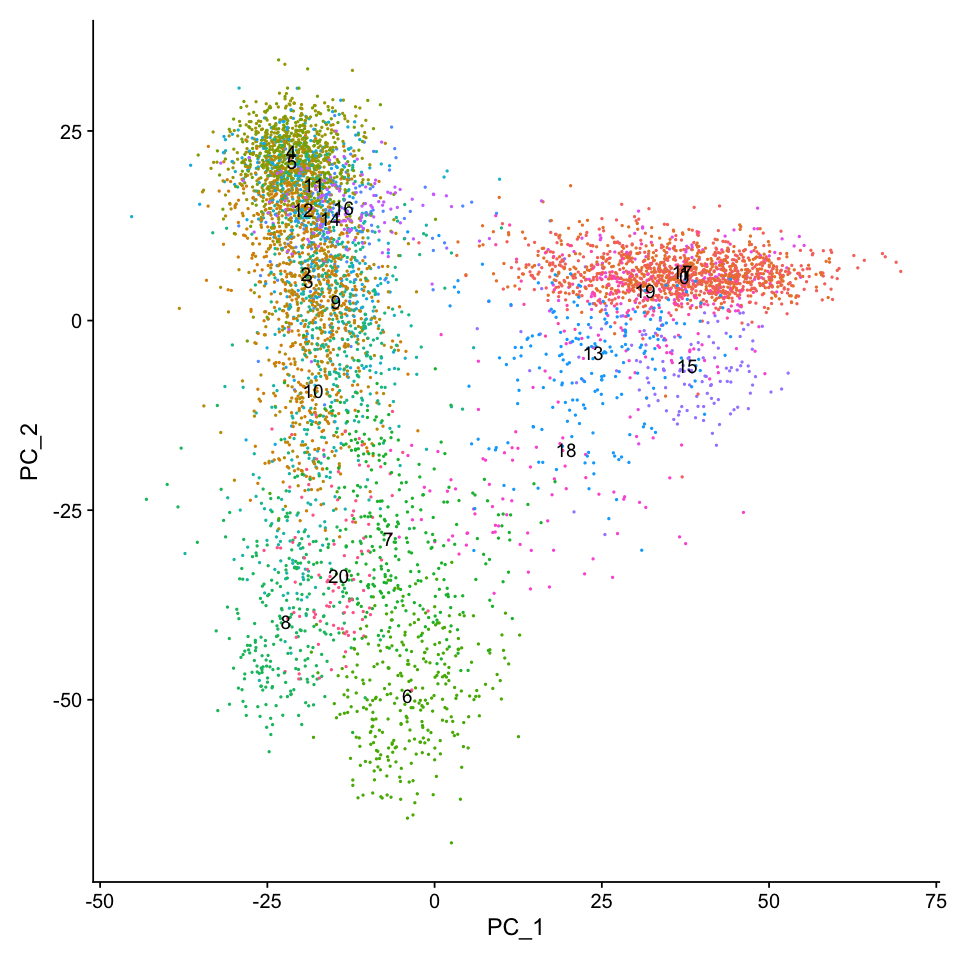

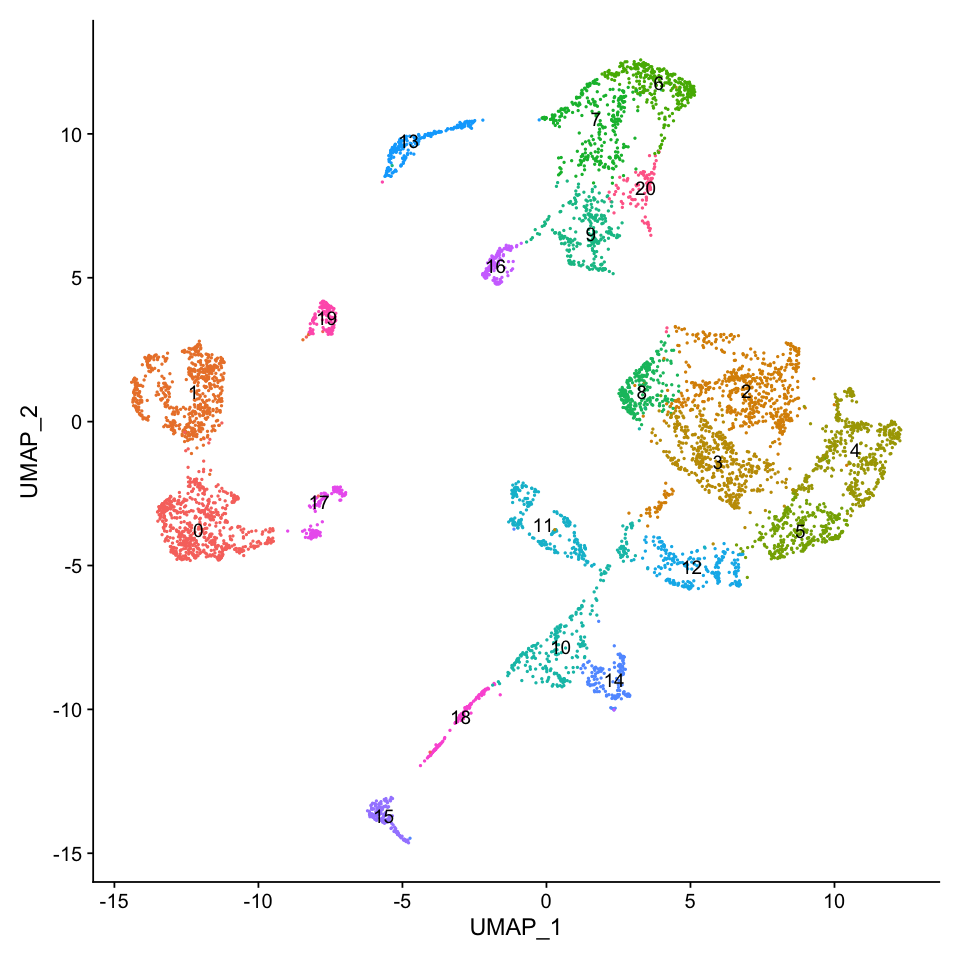

In [29]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, verbose = FALSE)
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_VF1500 <- FindNeighbors(seu_HQC_VF1500, dims = 1:30, verbose = FALSE)
seu_HQC_VF1500 <- FindClusters(seu_HQC_VF1500, verbose = FALSE)
DimPlot(seu_HQC_VF1500, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC_VF1500, reduction =  "umap", label = TRUE) + NoLegend()

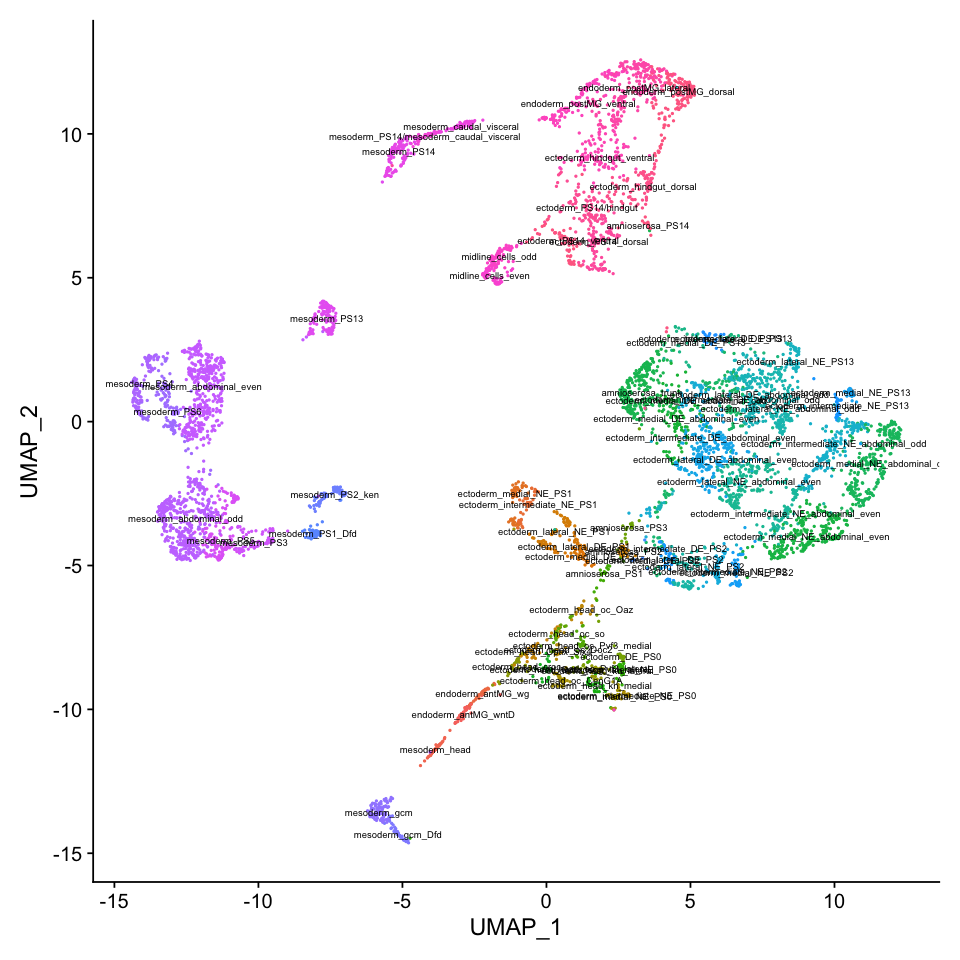

In [30]:
Idents(seu_HQC_VF1500) <- "manual_ID"
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_VF1500, reduction = 'umap', label.size = 2,label = T) + NoLegend()

In [31]:
levels <- read.table(file="../01_Set3/manual_ID_list/manual_ID_levels_color.txt", comment.char = "")
colors <- levels[,3]
colors <- colors[1:length(colors)-1]
levels <- levels[,1]
levels <- levels[1:length(levels)-1]
head(levels)
length(levels)
head(colors)

[1] "ectoderm_head_croc"       "ectoderm_head_Optix_Six4"
[3] "ectoderm_head_Optix_sog"  "ectoderm_head_oc_so"     
[5] "ectoderm_head_oc_Doc2"    "ectoderm_head_oc_CenG1A"

[1] 76

[1] "lightskyblue1" "lightskyblue1" "lightskyblue1" "lightskyblue1"
[5] "lightskyblue1" "lightskyblue1"

In [32]:
ave <- AverageExpression(object = seu_HQC_VF1500, assays = "SCT")

Finished averaging SCT for cluster endoderm_antMG_wntD

Finished averaging SCT for cluster mesoderm_head

Finished averaging SCT for cluster endoderm_antMG_wg

Finished averaging SCT for cluster ectoderm_intermediate_NE_PS1

Finished averaging SCT for cluster ectoderm_medial_NE_PS1

Finished averaging SCT for cluster ectoderm_medial_DE_PS1

Finished averaging SCT for cluster ectoderm_lateral_DE_PS1

Finished averaging SCT for cluster ectoderm_lateral_NE_PS1

Finished averaging SCT for cluster amnioserosa_PS2

Finished averaging SCT for cluster ectoderm_head_Optix_Six4

Finished averaging SCT for cluster ectoderm_head_oc_Oaz

Finished averaging SCT for cluster ectoderm_head_oc_Doc2

Finished averaging SCT for cluster ectoderm_intermediate_NE_PS0

Finished averaging SCT for cluster ectoderm_head_oc_CenG1A

Finished averaging SCT for cluster ectoderm_medial_NE_PS0

Finished averaging SCT for cluster ectoderm_head_kn_lateral

Finished averaging SCT for cluster ectoderm_head_croc

Finished 

In [33]:
head(ave$SCT, 30)

,endoderm_antMG_wntD,mesoderm_head,endoderm_antMG_wg,ectoderm_intermediate_NE_PS1,ectoderm_medial_NE_PS1,ectoderm_medial_DE_PS1,ectoderm_lateral_DE_PS1,ectoderm_lateral_NE_PS1,amnioserosa_PS2,ectoderm_head_Optix_Six4,⋯,midline_cells_odd,endoderm_postMG_ventral,ectoderm_hindgut_ventral,endoderm_postMG_lateral,ectoderm_PS14_dorsal,ectoderm_PS14/hindgut,ectoderm_hindgut_dorsal,endoderm_postMG_dorsal,ectoderm_PS14_ventral,amnioserosa_PS14
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
sog,5.12500000,5.59574468,0.81818182,45.51219512,122.60000000,1.64,2.56818182,14.26923077,1.31818182,2.44444444,⋯,199.77941176,49.26785714,29.66,8.90594059,4.22857143,43.88505747,0.88505747,1.43708609,134.265625,1.7692308
peb,5.81250000,0.10638298,10.39393939,0.12195122,0.14545455,0.40,0.18181818,0.38461538,0.90909091,0.14814815,⋯,0.44117647,4.50000000,0.58,18.43069307,0.58095238,0.47126437,9.28735632,53.49006623,0.343750,16.6153846
CG13653,0.12500000,0.04255319,19.36363636,0.02439024,0.07272727,0.76,0.15909091,0.09615385,24.54545455,11.51851852,⋯,0.16176471,0.16964286,0.11,0.23762376,0.21904762,0.10344828,9.42528736,5.99337748,0.078125,22.4615385
Abd-B,0.39583333,0.08510638,0.12121212,0.09756098,0.12727273,0.28,0.06818182,0.11538462,0.22727273,0.18518519,⋯,5.98529412,0.31250000,0.37,0.13861386,28.74285714,9.29885057,3.20689655,0.09271523,13.031250,19.1538462
E(spl)m7-HLH,2.22916667,0.25531915,7.21212121,7.36585366,3.72727273,0.76,1.00000000,2.75000000,4.00000000,2.55555556,⋯,76.35294118,26.37500000,5.04,1.65841584,0.52380952,10.33333333,0.89655172,1.52980132,20.156250,11.0000000
disco,0.33333333,0.29787234,7.39393939,0.17073171,0.27272727,11.96,11.04545455,0.84615385,0.68181818,2.07407407,⋯,0.64705882,21.27678571,43.99,8.25247525,8.85714286,40.77011494,36.16091954,2.86092715,10.734375,38.3846154
wntD,9.64583333,0.48936170,2.96969697,0.14634146,1.65454545,0.28,0.36363636,0.21153846,0.40909091,0.18518519,⋯,81.45588235,1.68750000,0.51,0.39603960,0.23809524,1.27586207,0.26436782,0.13907285,4.171875,0.1538462
salm,0.52083333,0.48936170,0.66666667,32.85365854,34.63636364,46.68,47.63636364,38.71153846,22.59090909,3.55555556,⋯,4.48529412,2.23214286,22.38,0.67326733,37.80000000,43.89655172,34.32183908,1.76158940,37.843750,30.4615385
Pdp1,1.06250000,0.31914894,0.81818182,0.14634146,0.03636364,0.16,0.02272727,0.13461538,0.00000000,0.14814815,⋯,0.08823529,13.97321429,9.78,30.90099010,0.53333333,0.24137931,1.03448276,17.83443709,0.546875,0.0000000


In [34]:
ave_SCT <- ave$SCT
dim(ave_SCT)

[1] 1500   76

### 1,500HVGs

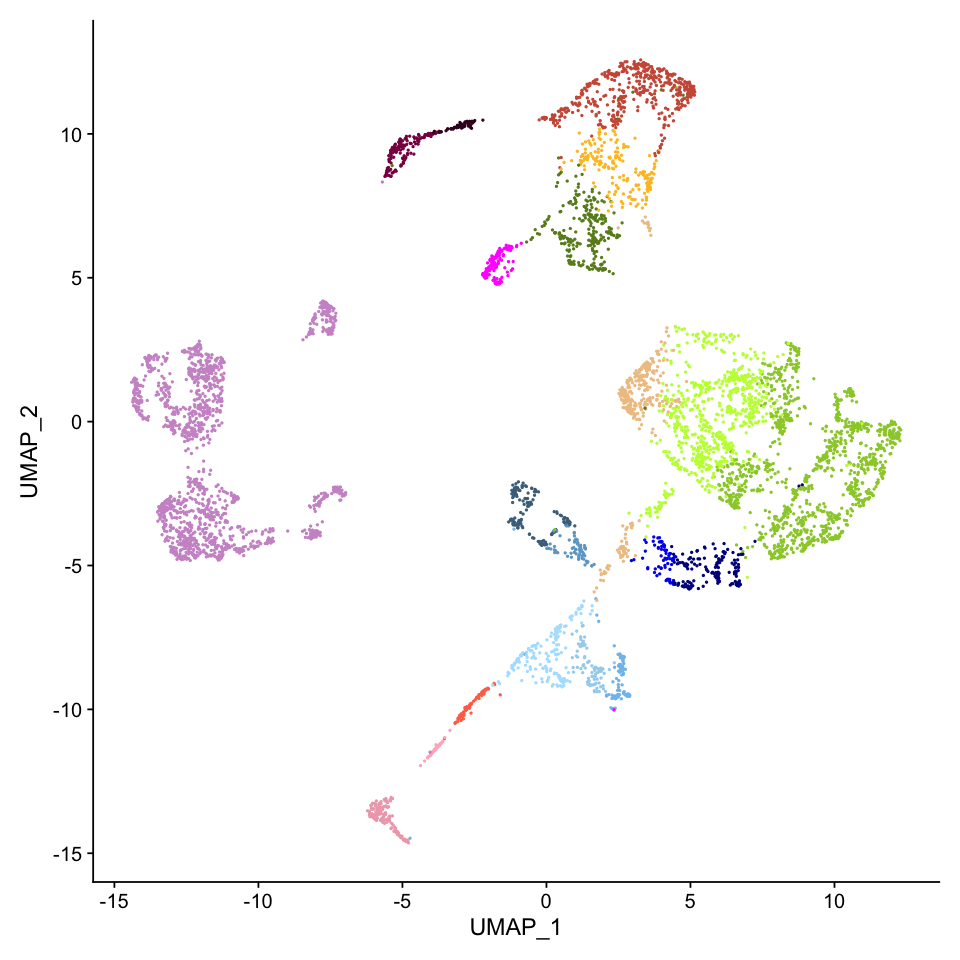

In [35]:
levels(seu_HQC_VF1500) <- levels
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_1500HVGs.eps', dpi = 300, width = 8, height = 8)

In [36]:
dist_euc_log <- dist(as.matrix(log2(t(ave_SCT+1))), method = "euclidean")
clust <- hclust(dist_euc_log, "average")
dend <- as.dendrogram(clust)

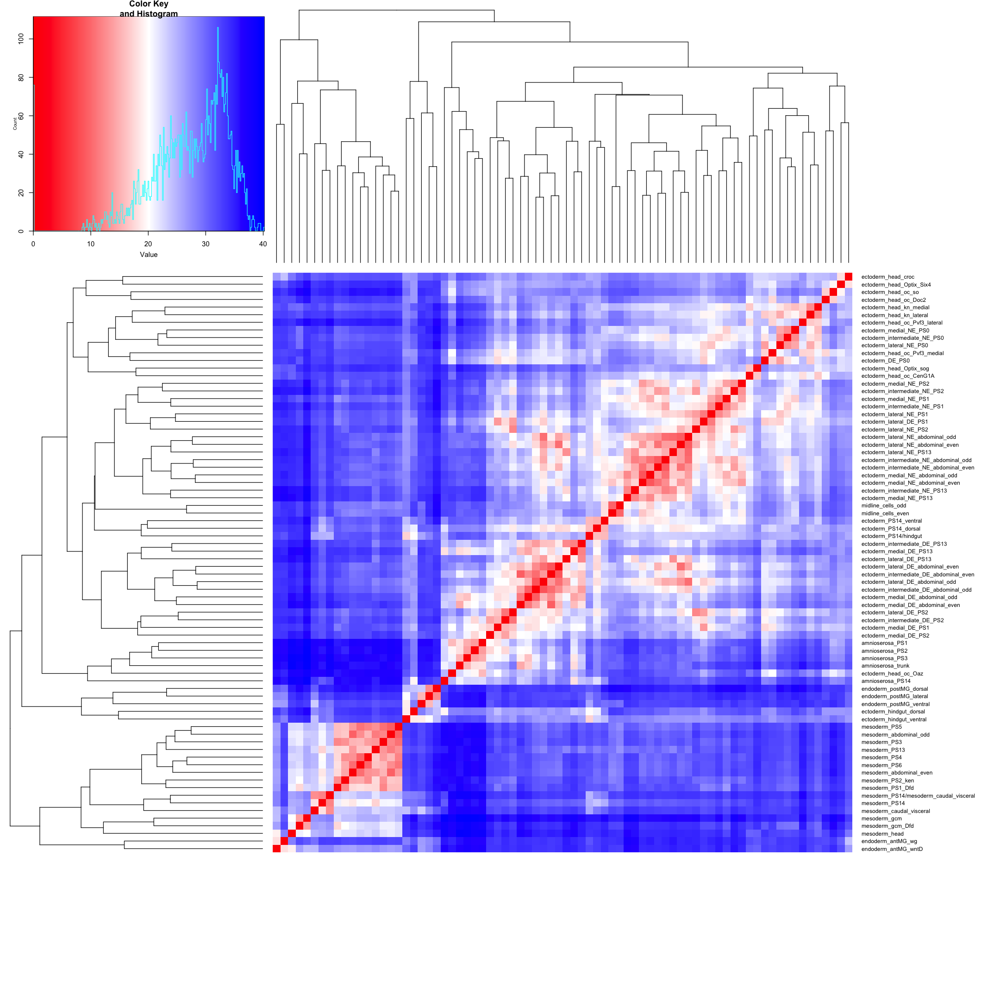

In [37]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend,  Rowv = dend)

In [38]:
postscript("./figures/heatmap_1500VFs.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend,  Rowv = dend)
dev.off()

pdf 
  2

### Transcription Factors

In [39]:
is.tf <- glad.table['Modified_GLAD']=='TF'
sum(is.tf)
tf.list <- glad.table[is.tf,'BDGP_ref_symbol']
head(tf.list)
length(unique(tf.list))

[1] 1018

[1] "CG45075-Kr-h1"     "CG42516-Pbp49"     "Hr3"              
[4] "pre-lola-G-lola"   "CG17724-Kdm4B-seq" "CG44434-CG44435"

[1] 1018

In [40]:
vf.list <- row.names(seu_HQC_VF1500)
tf.in.vf <- vf.list[vf.list %in% tf.list]
length(tf.in.vf)

[1] 258

In [41]:
tf.in.vf

[1] "peb"               "Abd-B"             "E(spl)m7-HLH"     
  [4] "disco"             "salm"              "Pdp1"             
  [7] "SoxN"              "fkh"               "ind"              
 [10] "ct"                "Optix"             "twi"              
 [13] "grn"               "mirr"              "ken"              
 [16] "gcm"               "Dll"               "Dfd"              
 [19] "zen"               "Antp"              "eve"              
 [22] "kn"                "E(spl)m5-HLH"      "knrl"             
 [25] "D"                 "Ubx"               "ftz"              
 [28] "CrebA"             "Doc3"              "Lim1"             
 [31] "gsb"               "cnc"               "hkb"              
 [34] "Doc1"              "ich"               "oc"               
 [37] "croc"              "srp"               "zfh1"             
 [40] "tup"               "E(spl)m8-HLH"      "SNCF"             
 [43] "HLH54F"            "tin"               "Gsc"              
 [46] "slp1"              "l(1)sc"            "rib"              
 [49] "scrt"              "gt"                "ac"               
 [52] "ttk"               "vvl"               "kni"              
 [55] "Blimp-1"           "sim"               "hth"              
 [58] "exex"              "hbn"               "zen2"             
 [61] "en"                "emc"               "Hmx"              
 [64] "E(spl)mgamma-HLH"  "aop"               "Six4"             
 [67] "eya"               "byn"               "Dr"               
 [70] "dpn"               "ab"                "run"              
 [73] "mid"               "Scr"               "ham"              
 [76] "Mef2"              "Oaz"               "tll"              
 [79] "edl"               "erm"               "Doc2"             
 [82] "Myc"               "kay"               "C15"              
 [85] "sc"                "pnr"               "ush"              
 [88] "tsh"               "ems"               "CG15696"          
 [91] "toy"               "btd"               "lov"              
 [94] "prd"               "pnt"               "nub"              
 [97] "bi"                "E(spl)mbeta-HLH"   "odd"              
[100] "Kr"                "caup"              "h"                
[103] "hb"                "Glut4EF"           "sna"              
[106] "bun"               "abd-A"             "esg"              
[109] "pb"                "CG11294"           "drm"              
[112] "brk"               "slp2"              "disco-r"          
[115] "fd102C"            "cad"               "grh"              
[118] "net"               "otp"               "luna"             
[121] "noc"               "CG17724-Kdm4B-seq" "vnd"              
[124] "bap"               "Ptx1"              "HGTX"             
[127] "CG9650"            "cic"               "jigr1"            
[130] "fd96Cb"            "so"                "shn"              
[133] "Sox21a"            "psq"               "CG42741"          
[136] "opa"               "Sp1"               "ovo"              
[139] "HmgD"              "Coop"              "CG32982"          
[142] "apt"               "klu"               "Df31"             
[145] "bowl"              "FoxL1"             "svp"              
[148] "corto"             "HmgZ"              "sob"              
[151] "Alh"               "sr"                "lab"              
[154] "slou"              "retn"              "vg"               
[157] "pros"              "bab2"              "pdm2"             
[160] "amos"              "E2f1"              "zfh2"             
[163] "Eip93F"            "ci"                "Eip75B"           
[166] "E(spl)mdelta-HLH"  "Poxn"              "dve"              
[169] "zld"               "sisA"              "sbb"              
[172] "tou"               "chn"               "tap"              
[175] "CG18446"           "spen"              "NK7.1"            
[178] "ato"               "cwo"               "kis"              
[181] "CG45050-CG43675"   "Rx"            

PC_ 1 
Positive:  SoxN, hth, D, aop, Antp, l(1)sc, gsb, brk, CG17724-Kdm4B-seq, slp1 
	   pnt, ind, Coop, mid, Dr, ac, tsh, esg, sc, jigr1 
	   vnd, en, cic, tou, slp2, ci, Dfd, ich, sbb, E(spl)mgamma-HLH 
Negative:  twi, SNCF, emc, rib, zfh1, tin, fkh, srp, Myc, Mef2 
	   peb, sna, disco, Pdp1, Doc3, net, Doc1, hkb, tup, mirr 
	   Doc2, CG32982, ush, retn, luna, byn, bab2, exex, CrebA, l(3)neo38 
PC_ 2 
Positive:  twi, tin, zfh1, Mef2, SNCF, sna, CG32982, HmgD, Ubx, HmgZ 
	   ich, slp1, scrt, run, mid, opa, tsh, nub, en, ftz 
	   E2f1, Six4, Alh, eve, noc, net, Su(var)3-9, cact, sbb, CG42741 
Negative:  peb, Doc1, Doc3, tup, fkh, srp, mirr, E(spl)m5-HLH, Doc2, ush 
	   Pdp1, disco, hkb, kay, grn, zen, E(spl)m7-HLH, bun, grh, C15 
	   aop, psq, pnr, exex, emc, zen2, bowl, corto, tll, Ptx1 
PC_ 3 
Positive:  Ubx, mirr, Antp, tup, tsh, pnr, Glut4EF, kay, Doc1, ush 
	   eve, hth, zen, Doc3, net, emc, opa, SNCF, C15, tin 
	   Doc2, nub, CrebA, abd-A, zen2, ich, peb, psq, aop, prd 
Negative

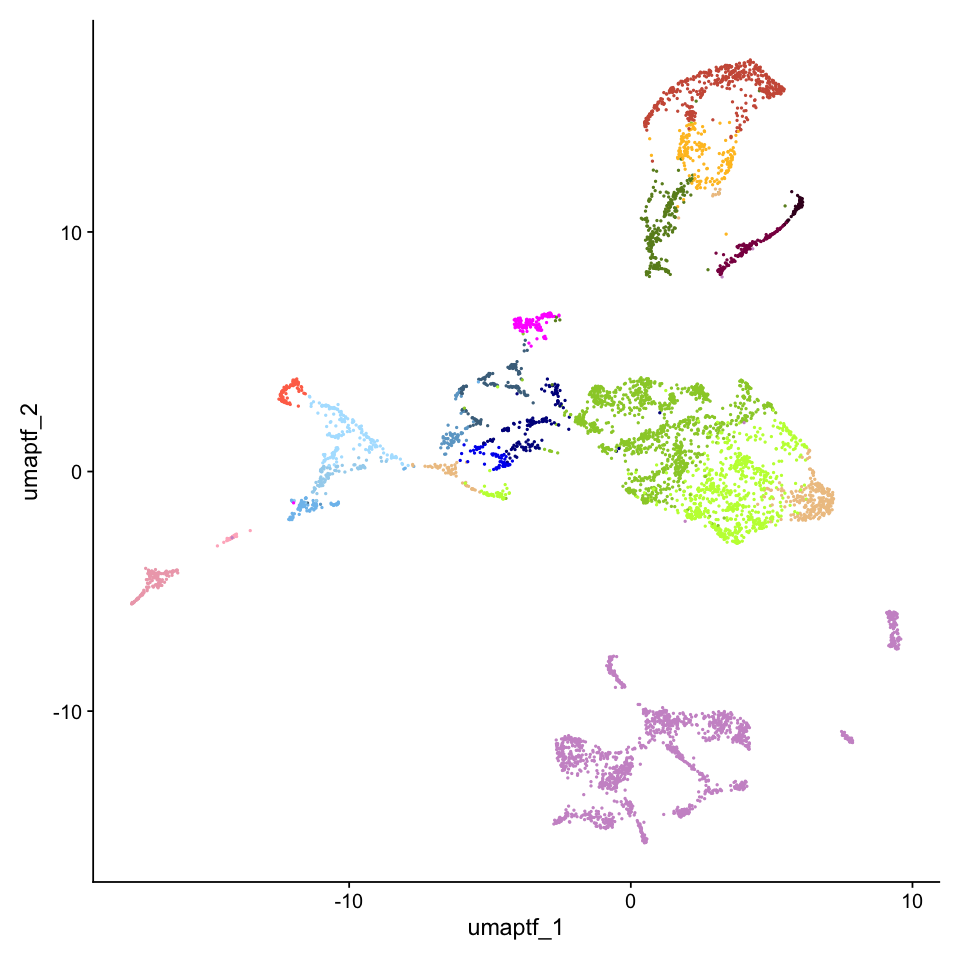

In [42]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = tf.in.vf, reduction.name = 'pca.tf')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.tf', dims = 1:30,
                          reduction.name = 'umap.tf')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.tf', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_258TFs.eps', dpi = 300, width = 8, height = 8)

In [43]:
ave_SCT_tf <- ave_SCT[tf.in.vf,]
dim(ave_SCT_tf)

[1] 258  76

In [44]:
dist_euc_log_tf<- dist(as.matrix(log2(t(ave_SCT_tf+1))), method = "euclidean")
clust_tf <- hclust(dist_euc_log_tf, "average")
dend_tf <- as.dendrogram(clust_tf)

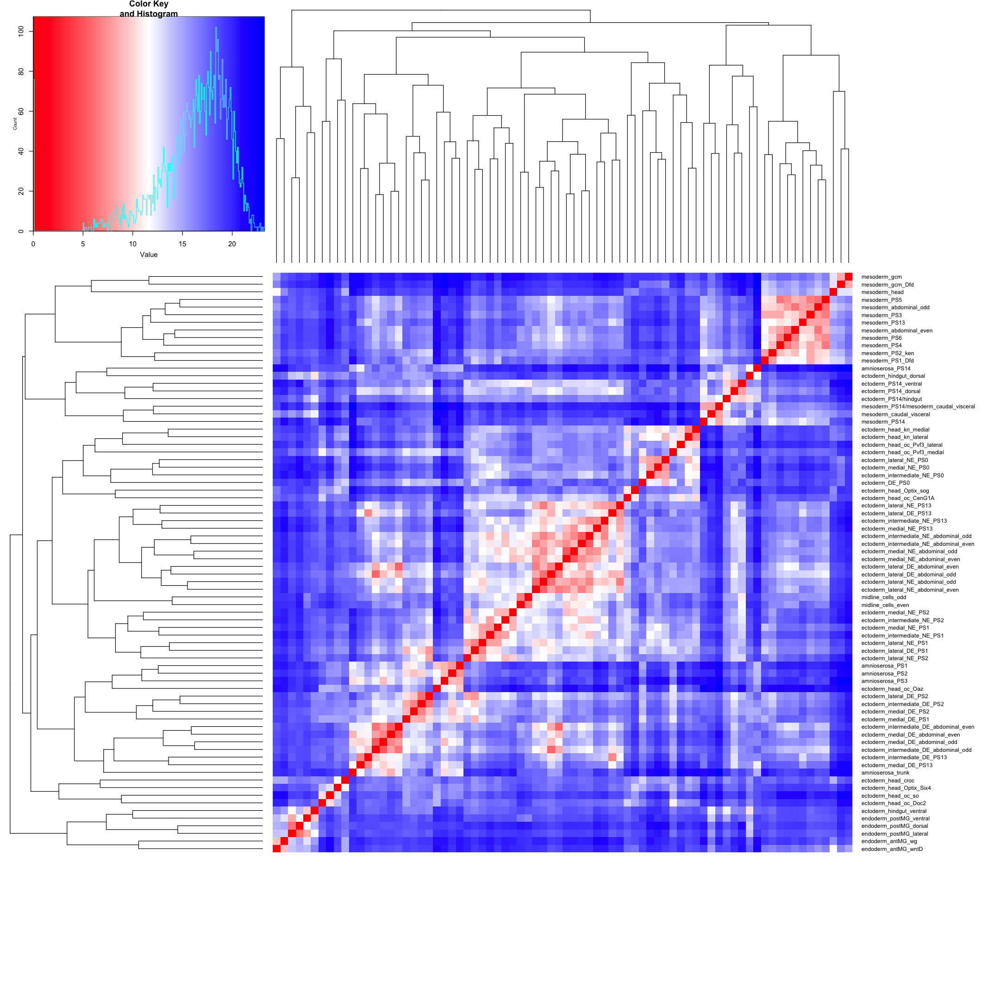

In [45]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_tf), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_tf,  Rowv = dend_tf)

In [46]:
postscript("./figures/heatmap_258TFs.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_tf), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_tf,  Rowv = dend_tf)
dev.off()

pdf 
  2

### PM-related genes

In [47]:
is.pm <- glad.table['Modified_GLAD']=='PM-related'
sum(is.pm)
pm.list <- glad.table[is.pm,'BDGP_ref_symbol']
head(pm.list)
length(unique(pm.list))

[1] 3451

[1] "CG34178-CG34177"   "CG43355-sala"      "BicC-CG45084"     
[4] "CG34313-CG31743"   "beat-IIIa-CG34106" "CG15386-CG42371"

[1] 3451

#### All PM-related genes (409 genes) in VF

In [48]:
pm.in.vf <- vf.list[vf.list %in% pm.list]
length(pm.in.vf)

[1] 409

PC_ 1 
Positive:  Ilp4, CadN, htl, CG3036, CG43355-sala, wntD, Ama, Mdr49, NetA, be 
	   NetB, Ndae1, mthl1, if, Nrt, ltl, side-V, fog, Inx3, CG6398 
	   babos, RnrS, wgn, lbk, ogre, msn, CG3638, Nrg, CG13248, kirre 
Negative:  CG10035, cv-2, ImpL2, blot, ths, CG13217, egr, sog, mew, wb 
	   Meltrin, CG45263, bib, 5-HT2A, CG12420, CG14915, Tollo, Dtg, Egfr, grnd 
	   vn, pyr, NimC4, mgl, hbs, mnd, Svil, fra, tinc, sli 
PC_ 2 
Positive:  sog, ImpL2, ths, Tollo, Toll-6, CG43355-sala, Cys, Meltrin, pyr, robo2 
	   wb, trn, fend, T48, dally, vn, Obp99a, upd1, CG42662-CG30080, CG13217 
	   mfas, CG30089, CG6398, bib, RnrS, Ilp4, CG43394, wntD, CG3625, Pvf3 
Negative:  egr, cv-2, CG12420, CG45263, Dtg, Ama, hbs, Svil, sas, Oatp74D 
	   Ance, Lapsyn, MFS14, CG14915, Fas2, CG2930, mnd, CG42342, ana, CG4096 
	   rst, ImpE2, smal, bnl, Nrt, Ect4, fog, CG6847, CG12986, Nox 
PC_ 3 
Positive:  Oatp74D, CG2930, mnd, Fas2, smal, ImpE2, Lapsyn, CG32053, sog, Ndae1 
	   sas, fog, Notum, CG3655, Cys, CG

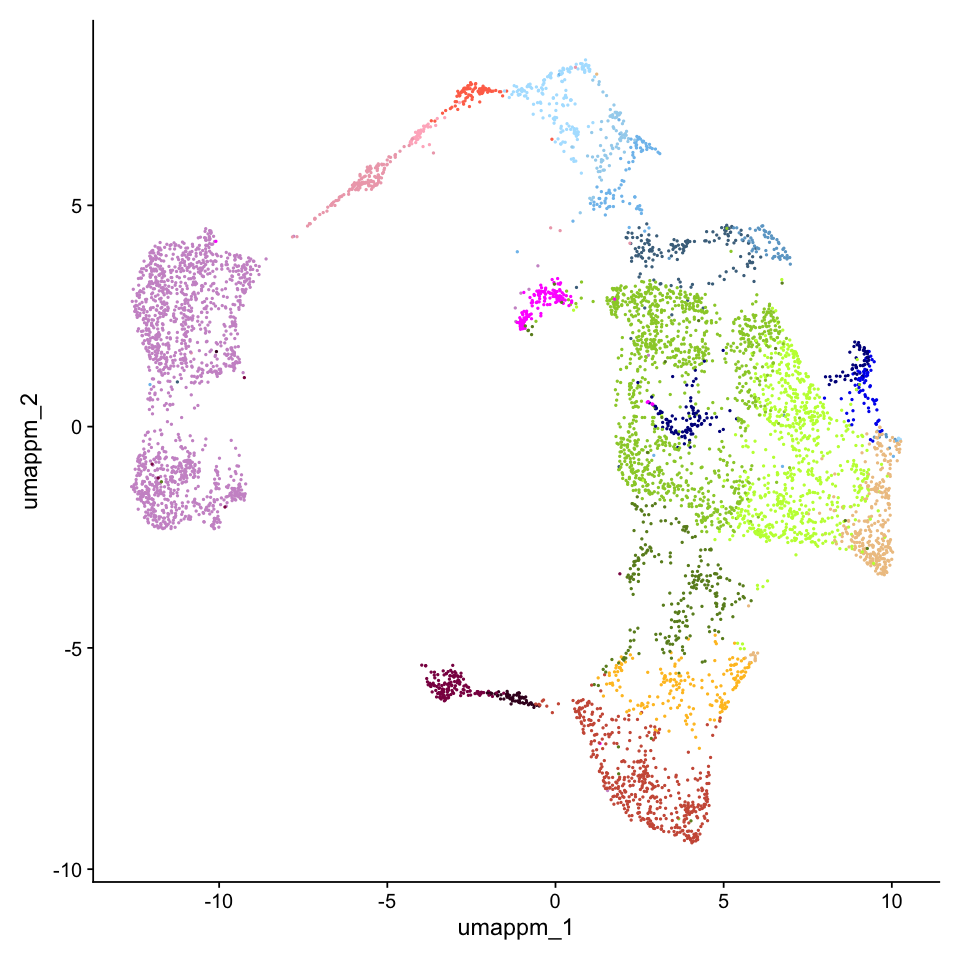

In [49]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = pm.in.vf, reduction.name = 'pca.pm')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.pm', dims = 1:30,
                          reduction.name = 'umap.pm')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.pm', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_409PMrelated.eps', dpi = 300, width = 8, height = 8)

In [50]:
ave_SCT_pm <- ave_SCT[pm.in.vf,]
dim(ave_SCT_pm)
dist_euc_log_pm<- dist(as.matrix(log2(t(ave_SCT_pm+1))), method = "euclidean")
clust_pm <- hclust(dist_euc_log_pm, "average")
dend_pm <- as.dendrogram(clust_pm)

[1] 409  76

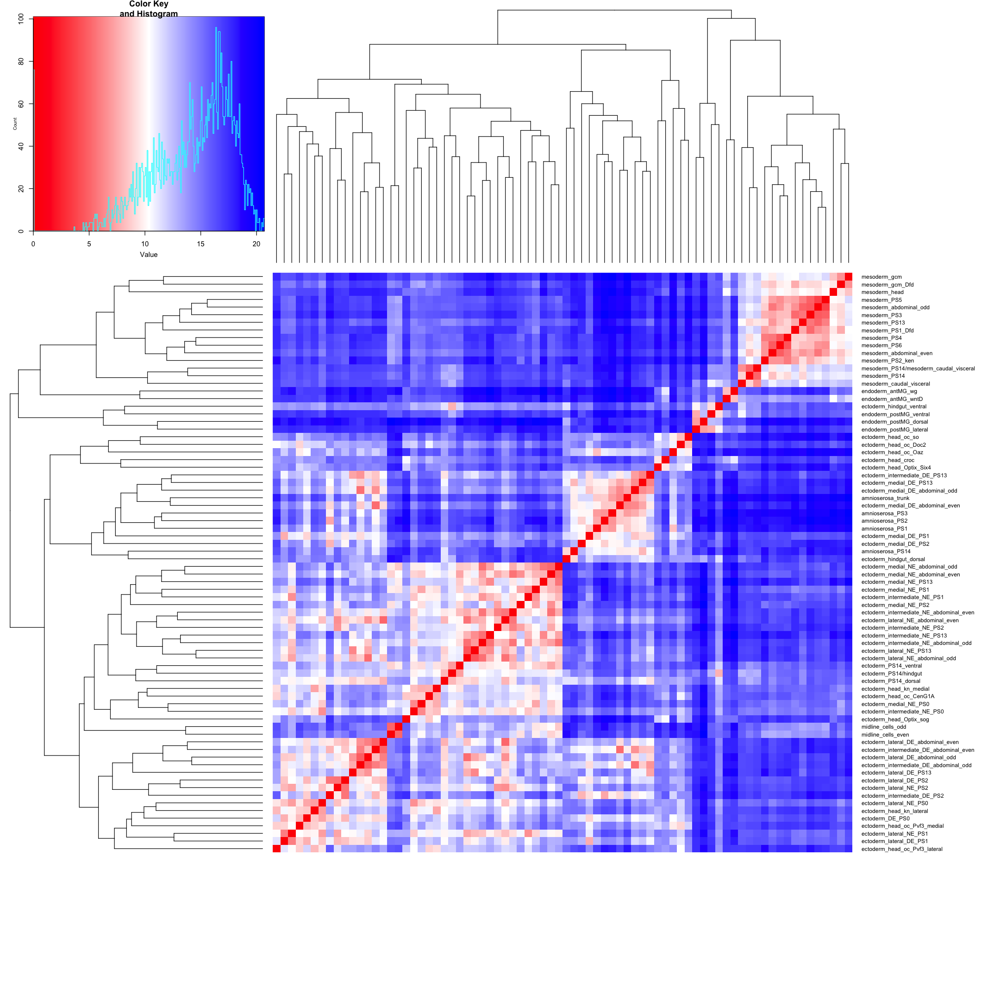

In [51]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_pm), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_pm,  Rowv = dend_pm)

In [52]:
postscript("./figures/heatmap_409PM_related.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_pm), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_pm,  Rowv = dend_pm)
dev.off()

pdf 
  2

#### the same number as TFs

PC_ 1 
Positive:  Ilp4, CadN, htl, CG3036, CG43355-sala, wntD, Ama, Mdr49, NetA, be 
	   NetB, Ndae1, mthl1, if, Nrt, ltl, side-V, fog, Inx3, CG6398 
	   babos, RnrS, wgn, lbk, ogre, msn, CG3638, Nrg, CG13248, kirre 
Negative:  CG10035, cv-2, ImpL2, blot, ths, CG13217, egr, sog, mew, wb 
	   Meltrin, CG45263, bib, 5-HT2A, CG12420, CG14915, Dtg, Tollo, Egfr, grnd 
	   vn, pyr, NimC4, mgl, hbs, mnd, Svil, fra, tinc, sli 
PC_ 2 
Positive:  sog, ImpL2, ths, Tollo, Toll-6, CG43355-sala, Cys, Meltrin, pyr, robo2 
	   wb, trn, fend, T48, Obp99a, dally, vn, upd1, CG42662-CG30080, mfas 
	   CG13217, CG30089, bib, RnrS, CG6398, CG43394, Ilp4, wntD, CG3625, 18w 
Negative:  egr, cv-2, CG12420, CG45263, Dtg, Ama, hbs, Svil, sas, Oatp74D 
	   Ance, MFS14, Lapsyn, CG14915, Fas2, CG2930, mnd, CG42342, ana, CG4096 
	   rst, ImpE2, smal, bnl, Nrt, Ect4, fog, CG6847, CG12986, fra 
PC_ 3 
Positive:  Oatp74D, CG2930, mnd, Fas2, smal, ImpE2, Lapsyn, CG32053, Ndae1, sog 
	   sas, fog, Notum, CG3655, Cys, CG3

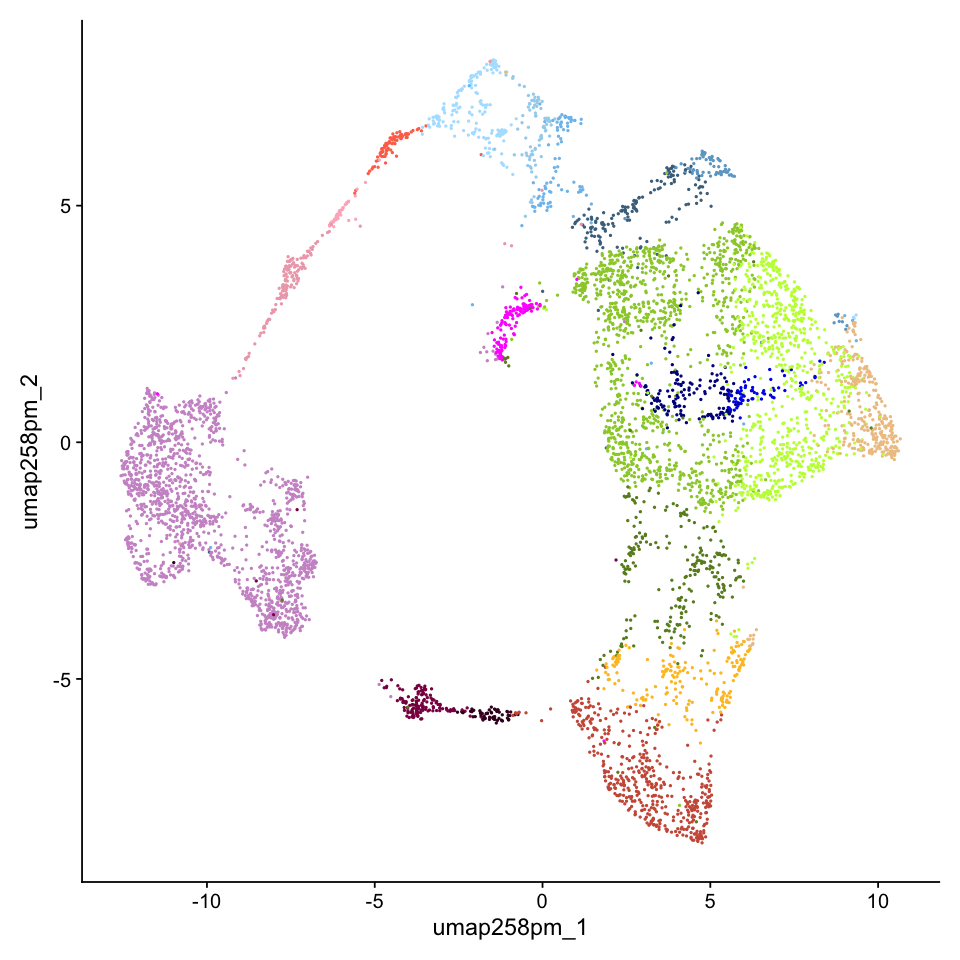

In [53]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = pm.in.vf[1:258], reduction.name = 'pca.258pm')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.258pm', dims = 1:30,
                          reduction.name = 'umap.258pm')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.258pm', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_258PMrelated.eps', dpi = 300, width = 8, height = 8)

In [54]:
ave_SCT_pm <- ave_SCT[pm.in.vf[1:258],]
dim(ave_SCT_pm)
dist_euc_log_pm<- dist(as.matrix(log2(t(ave_SCT_pm+1))), method = "euclidean")
clust_pm <- hclust(dist_euc_log_pm, "average")
dend_pm <- as.dendrogram(clust_pm)

[1] 258  76

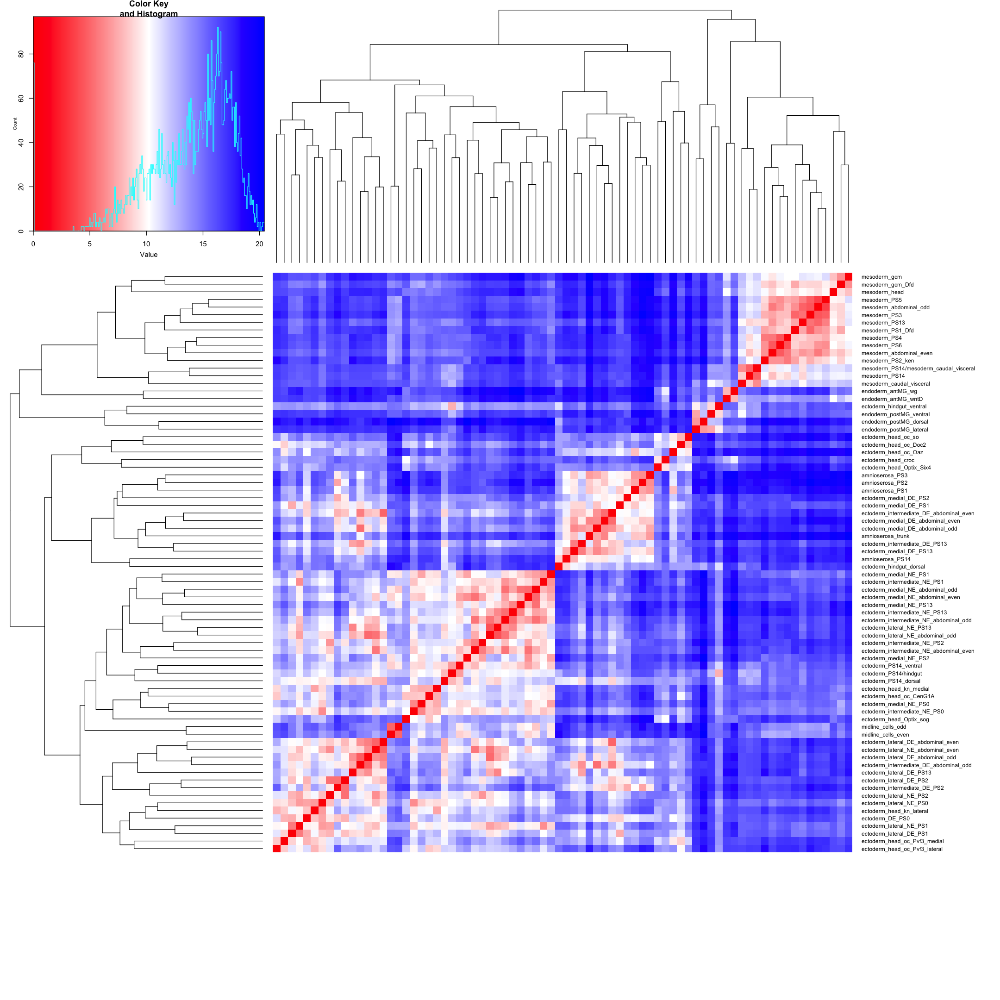

In [55]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_pm), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_pm,  Rowv = dend_pm)

In [56]:
postscript("./figures/heatmap_258PM_related.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_pm), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_pm,  Rowv = dend_pm)
dev.off()

pdf 
  2

### Without TFs

#### All genes without TFs in 1,500 VFs

In [57]:
not.tf.in.vf <- vf.list[!(vf.list %in% tf.list)]
length(not.tf.in.vf)

[1] 1242

PC_ 1 
Positive:  Ilp4, hll, CadN, sprt, Cyp310a1, htl, VepD, CG3036, CG12177, Mes2 
	   Pka-C3, stg, CG14688, Ama, wntD, CG43355-sala, Act87E, stumps, Mdr49, Nplp2 
	   sty, CG11357, be, CG7029, CG1673, NetA, CycE, shep, kibra, mthl1 
Negative:  CG13427, Lac, CG34224, CG10035, ImpL2, Atx-1, cv-2, Dl, sog, crb 
	   CG15628, ths, ASPP, blot, Tet, Ptr, Tom, CG13217, E(spl)m4-BFM, sdt 
	   CG15480, mew, CG4440, sca, Brd, bib, Btk29A, Meltrin, jbug, wb 
PC_ 2 
Positive:  ps, Oatp74D, egr, Gmap, CG2930, Pepck-CG45087, DNaseII, mnd, CG12420, spri 
	   sas, Fas2, Lapsyn, phu, smal, cv-c, RapGAP1, ImpE2, CG13653, MFS14 
	   Nplp2, cv-2, Svil, CG45263, CG4096, Z600, CG12643, CG32053, CG14317, hbs 
Negative:  sog, ImpL2, sca, Toll-6, ths, Tollo, Ilp4, CG15628, CG34224, trn 
	   robo2, CG43355-sala, Tet, pri, Meltrin, CG5059, wb, CG6398, stg, dan 
	   pyr, Dl, lncRNA:bxd, CG15480, path, fend, Imp-CR45204, comm, wech, Pino 
PC_ 3 
Positive:  cv-2, Ama, Dtg, CG45263, Z600, egr, Alk, hbs, rho, Ance 

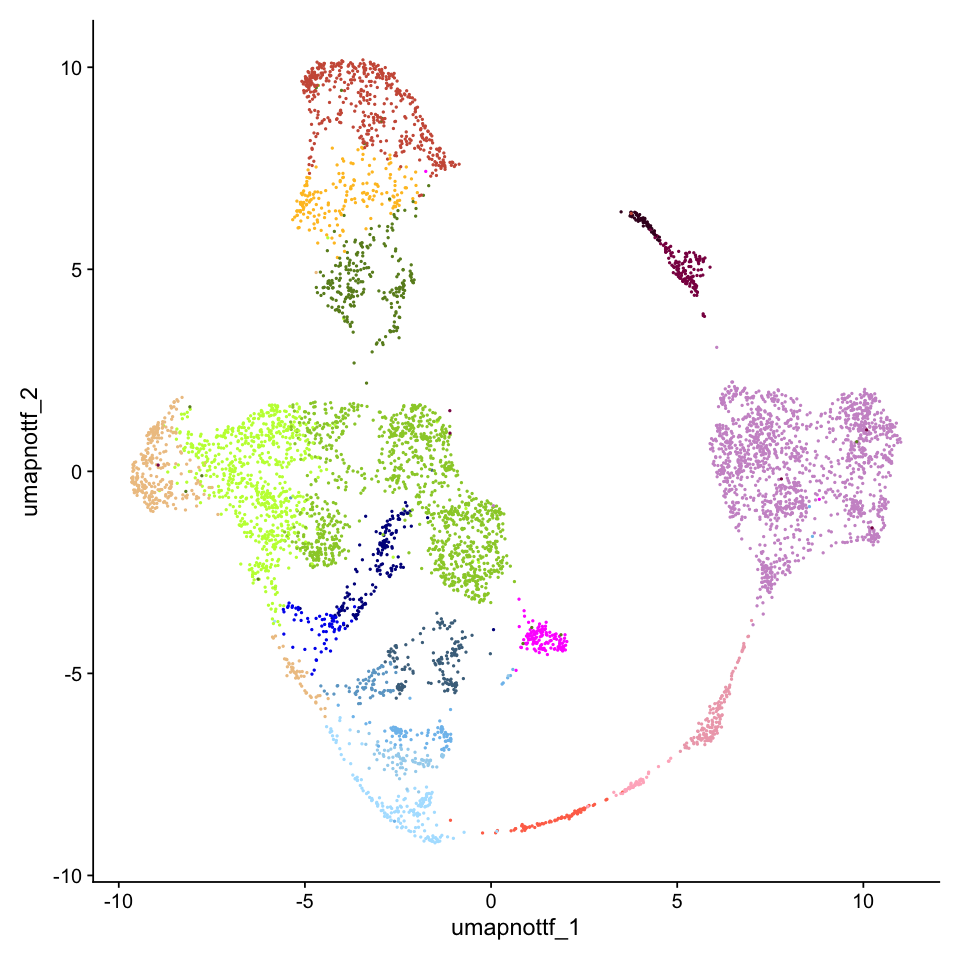

In [58]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = not.tf.in.vf, reduction.name = 'pca.nottf')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.nottf', dims = 1:30,
                          reduction.name = 'umap.nottf')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.nottf', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_1242notTF.eps', dpi = 300, width = 8, height = 8)

In [59]:
ave_SCT_not_tf <- ave_SCT[not.tf.in.vf,]
dim(ave_SCT_not_tf)
dist_euc_log_not_tf<- dist(as.matrix(log2(t(ave_SCT_not_tf+1))), method = "euclidean")
clust_not_tf <- hclust(dist_euc_log_not_tf, "average")
dend_not_tf <- as.dendrogram(clust_not_tf)

[1] 1242   76

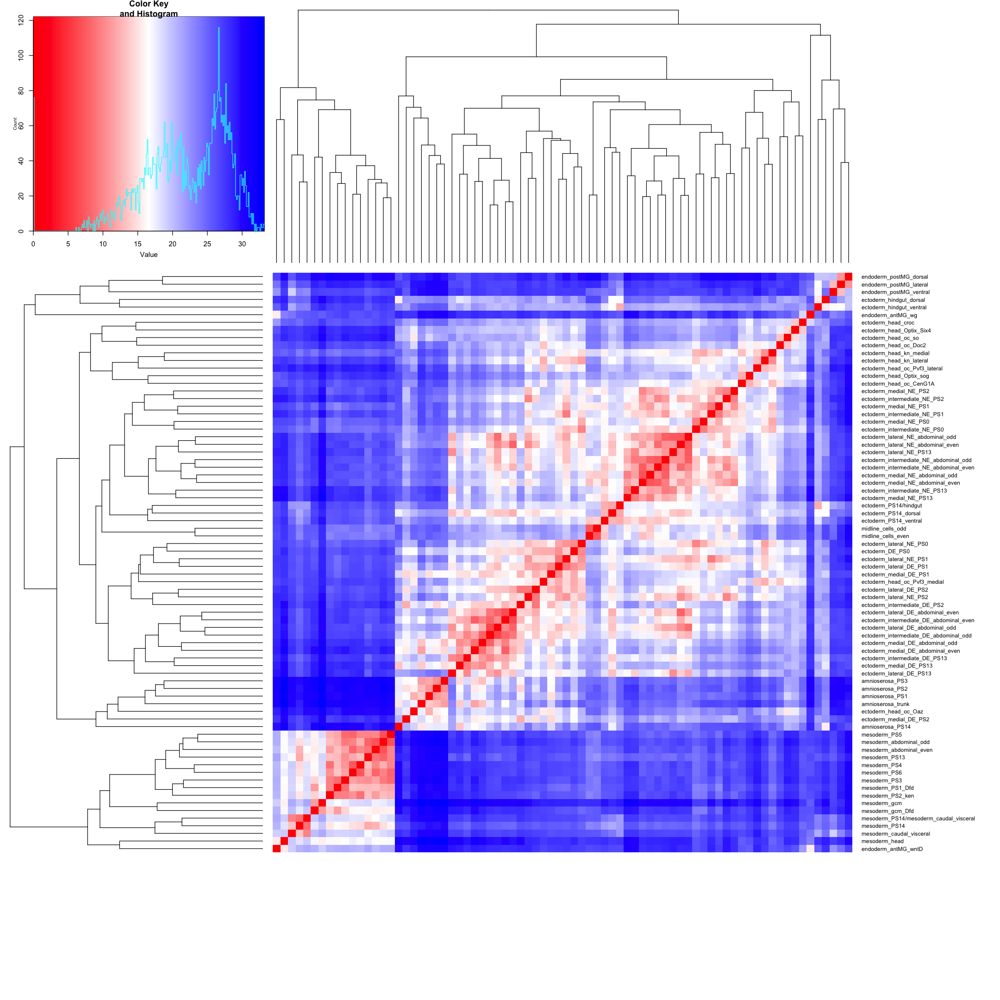

In [60]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_not_tf), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not_tf,  Rowv = dend_not_tf)

In [61]:
postscript("./figures/heatmap_1242NotTF.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_not_tf), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not_tf,  Rowv = dend_not_tf)
dev.off()

pdf 
  2

#### The same number as TFs

PC_ 1 
Positive:  Ilp4, hll, CadN, sprt, Cyp310a1, htl, VepD, CG3036, CG12177, stg 
	   Pka-C3, Mes2, CG14688, Ama, wntD, CG43355-sala, Act87E, stumps, Mdr49, sty 
	   CG11357, Nplp2, be, CG1673, CG7029, NetA, CycE, shep, Nrt, kibra 
Negative:  CG13427, Lac, CG34224, CG10035, ImpL2, Atx-1, Dl, cv-2, sog, crb 
	   CG15628, ths, ASPP, blot, Tet, Ptr, CG13217, E(spl)m4-BFM, Tom, sdt 
	   CG15480, mew, CG4440, sca, Brd, Meltrin, aay, Btk29A, wb, CG5059 
PC_ 2 
Positive:  egr, ps, Oatp74D, Gmap, CG2930, CG12420, Pepck-CG45087, DNaseII, mnd, sas 
	   phu, Fas2, cv-2, spri, CG13653, Lapsyn, cv-c, RapGAP1, CG45263, Z600 
	   Svil, MFS14, smal, hbs, Alk, ImpE2, rho, Dtg, scyl, Nplp2 
Negative:  sog, ImpL2, sca, ths, Toll-6, Tollo, CG43355-sala, Tet, CG15628, trn 
	   CG34224, robo2, Ilp4, Meltrin, pri, wb, CG5059, Dl, pyr, CG15480 
	   path, Pino, stg, fend, comm, Imp-CR45204, rdx, lncRNA:bxd, dally, Ocho 
PC_ 3 
Positive:  cv-2, Ama, Dtg, CG45263, Z600, egr, Alk, rho, Ance, hbs 
	   dap, CG136

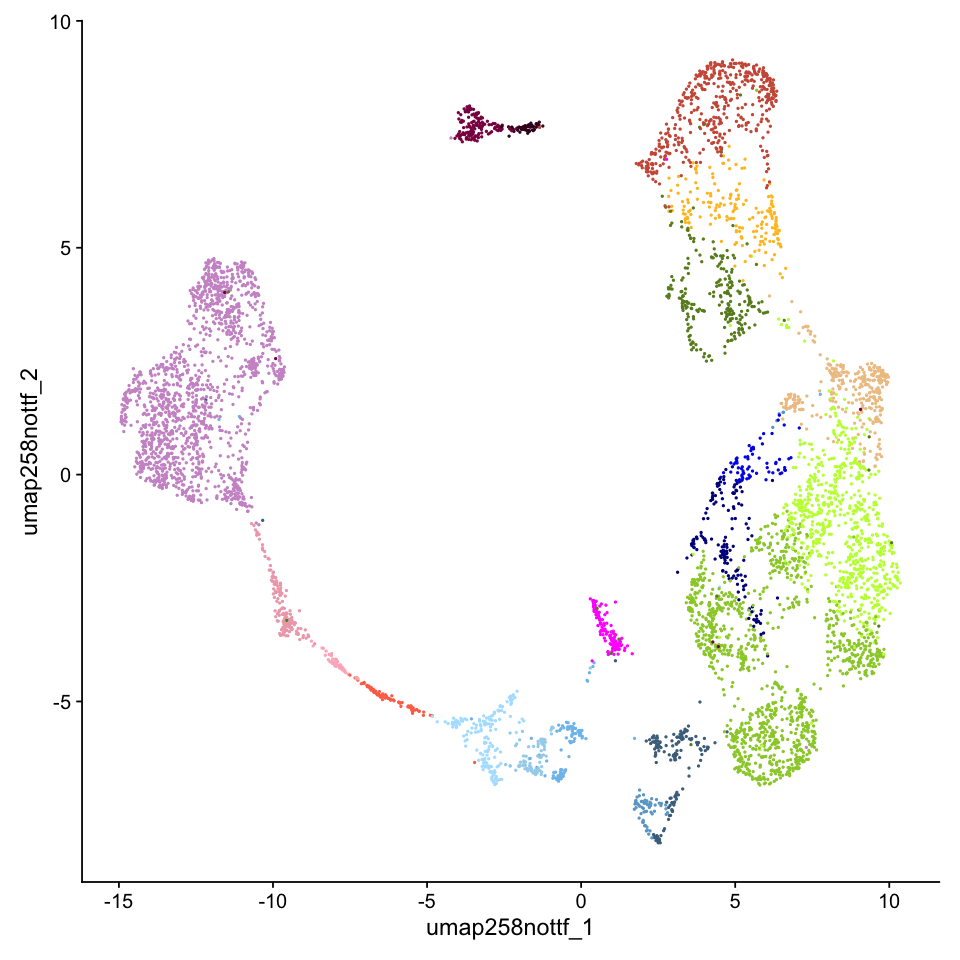

In [62]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = not.tf.in.vf[1:258], reduction.name = 'pca.258nottf')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.258nottf', dims = 1:30,
                          reduction.name = 'umap.258nottf')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.258nottf', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_258notTF.eps', dpi = 300, width = 8, height = 8)

In [63]:
ave_SCT_not_tf <- ave_SCT[not.tf.in.vf[1:258],]
dim(ave_SCT_not_tf)
dist_euc_log_not_tf<- dist(as.matrix(log2(t(ave_SCT_not_tf+1))), method = "euclidean")
clust_not_tf <- hclust(dist_euc_log_not_tf, "average")
dend_not_tf <- as.dendrogram(clust_not_tf)

[1] 258  76

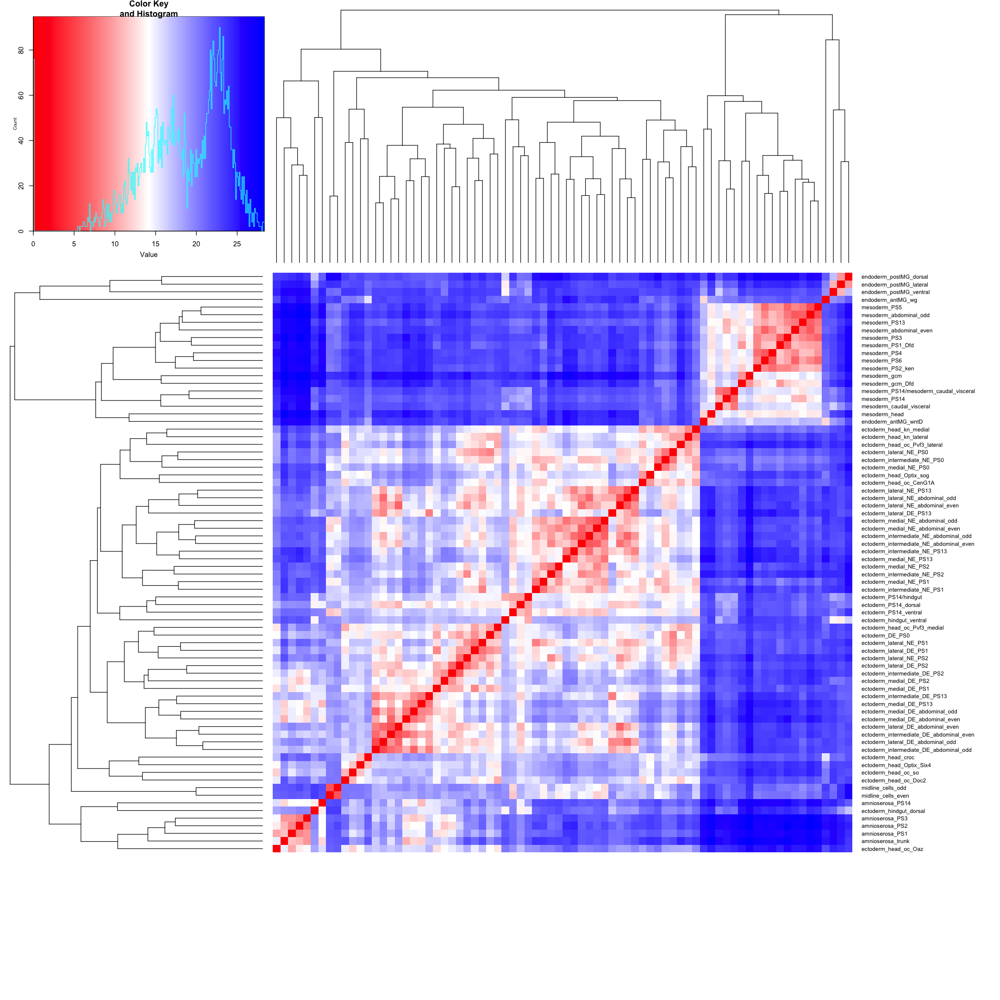

In [64]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_not_tf), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not_tf,  Rowv = dend_not_tf)

In [65]:
postscript("./figures/heatmap_258NotTF.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_not_tf), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not_tf,  Rowv = dend_not_tf)
dev.off()

pdf 
  2

### Without TFs and PM-related

#### All genes without TFs and PM-related in 1,500 HVGs

In [66]:
not.tf.nor.pm.in.vf <- vf.list[!(vf.list %in% tf.list)&!(vf.list %in% pm.list)]
length(not.tf.nor.pm.in.vf)

[1] 833

PC_ 1 
Positive:  CG13427, Lac, CG34224, Atx-1, Dl, CG15628, crb, ASPP, Tet, E(spl)m4-BFM 
	   Ptr, Tom, CG15480, sdt, CG4440, sca, Brd, jbug, CG5059, Btk29A 
	   rho, ec, aay, halo, toc, CG34383, Pino, Z600, E(spl)malpha-BFM, yellow-e3 
Negative:  hll, Cyp310a1, sprt, VepD, CG12177, Mes2, Pka-C3, stg, CG14688, Act87E 
	   stumps, Nplp2, sty, CG11357, CG7029, CG1673, CycE, shep, kibra, Traf4 
	   GEFmeso, lncRNA:CR45361, tkv, CG43658, CG9005, pigs, Asph, Tis11, Spn, Fbxl7 
PC_ 2 
Positive:  sca, CG34224, CG15628, stg, pri, lncRNA:bxd, CG5059, wech, dan, sprt 
	   Imp-CR45204, fz2, path, comm, Tet, CG15480, danr, tkv, ptc, pigs 
	   Pka-C3, Atg18a, hh, sty, nkd, Brd, Ocho, neur, how, drongo 
Negative:  ps, Gmap, DNaseII, Pepck-CG45087, spri, aay, phu, Nplp2, cv-c, CG12643 
	   RapGAP1, CG14317, CG13912, bnb, Thor, a, CG16758, bru2, CG8036, CG7191 
	   alpha-Est1, Tis11, bbg, CG42762, lncRNA:CR43126, CG13653, l(3)02640, CG3940, Rtnl1, CG10365 
PC_ 3 
Positive:  rho, Z600, Alk, CG13653, s

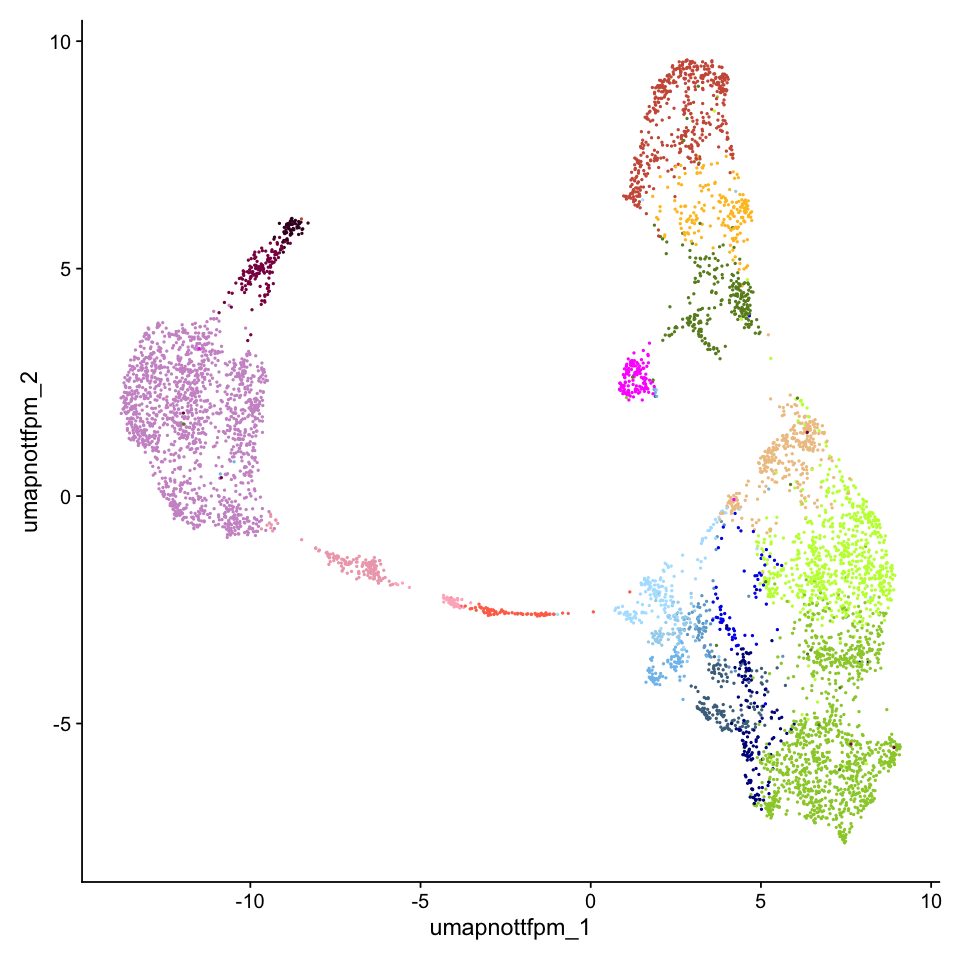

In [67]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = not.tf.nor.pm.in.vf, reduction.name = 'pca.nottfpm')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.nottfpm', dims = 1:30,
                          reduction.name = 'umap.nottfpm')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.nottfpm', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_833NotTFnorPM.eps', dpi = 300, width = 8, height = 8)

In [68]:
ave_SCT_not_tfpm <- ave_SCT[not.tf.nor.pm.in.vf,]
dim(ave_SCT_not_tfpm)
dist_euc_log_not_tfpm<- dist(as.matrix(log2(t(ave_SCT_not_tfpm+1))), method = "euclidean")
clust_not_tfpm <- hclust(dist_euc_log_not_tfpm, "average")
dend_not_tfpm <- as.dendrogram(clust_not_tfpm)

[1] 833  76

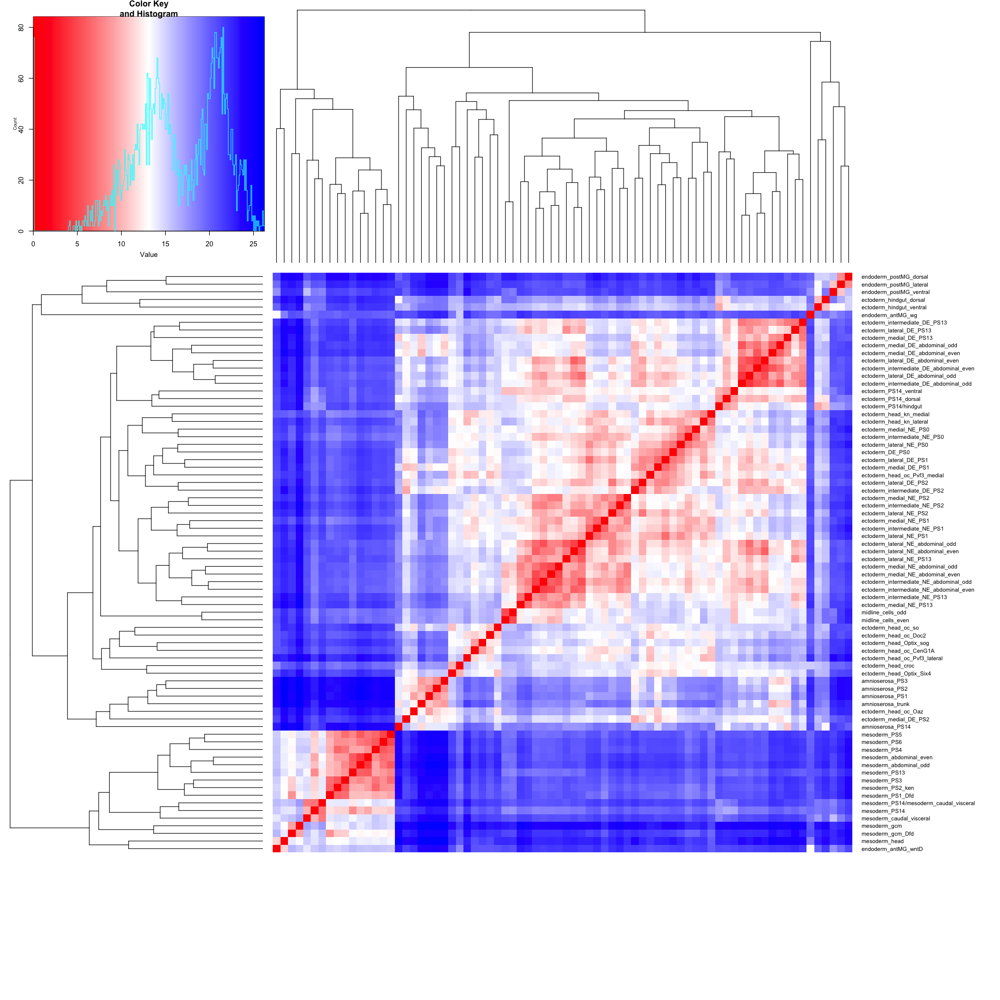

In [69]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_not_tfpm), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not_tfpm,  Rowv = dend_not_tfpm)

In [70]:
postscript("./figures/heatmap_833NotTFPM.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_not_tfpm), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not_tfpm,  Rowv = dend_not_tfpm)
dev.off()

pdf 
  2

#### The same number as TFs

PC_ 1 
Positive:  CG13427, Lac, CG34224, Atx-1, Dl, CG15628, crb, ASPP, Tet, E(spl)m4-BFM 
	   Ptr, Tom, CG15480, sdt, sca, CG4440, Brd, jbug, CG5059, Btk29A 
	   rho, aay, ec, toc, halo, CG34383, Pino, E(spl)malpha-BFM, Z600, yellow-e3 
Negative:  hll, Cyp310a1, sprt, VepD, CG12177, Mes2, stg, Pka-C3, CG14688, Act87E 
	   stumps, Nplp2, sty, CG11357, CG1673, CG7029, CycE, shep, kibra, Traf4 
	   GEFmeso, lncRNA:CR45361, tkv, CG43658, CG9005, pigs, Asph, Tis11, Spn, Fbxl7 
PC_ 2 
Positive:  sca, CG34224, CG15628, pri, stg, lncRNA:bxd, CG5059, dan, wech, Imp-CR45204 
	   sprt, path, Tet, comm, CG15480, fz2, tkv, pigs, Pka-C3, hh 
	   ptc, CG13427, Ocho, Brd, sty, rdx, nkd, Ppa, jbug, Pino 
Negative:  ps, Gmap, DNaseII, Pepck-CG45087, spri, phu, Nplp2, aay, cv-c, RapGAP1 
	   CG12643, CG14317, CG13912, bnb, Thor, a, CG16758, bru2, CG8036, CG7191 
	   alpha-Est1, Tis11, bbg, CG13653, lncRNA:CR43126, CG42762, CG3940, halo, CG7029, GstD5 
PC_ 3 
Positive:  rho, Z600, Alk, CG13653, scyl, dap

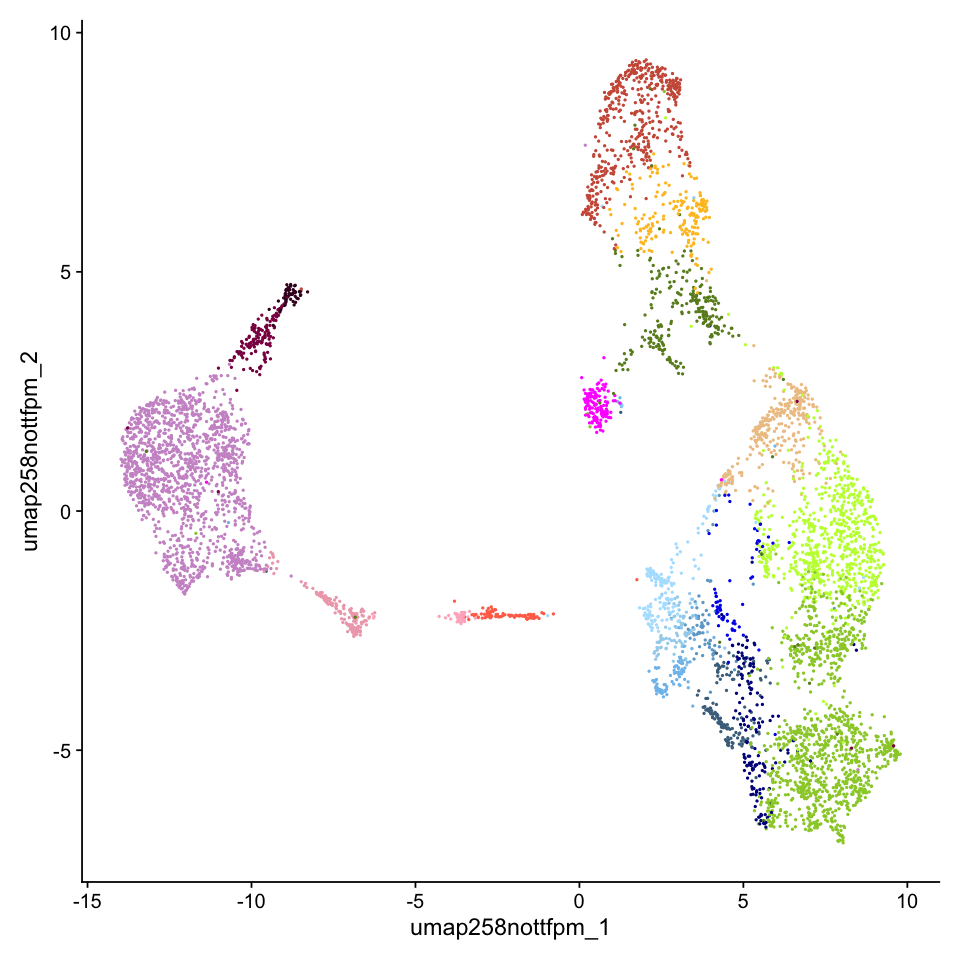

In [71]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = not.tf.nor.pm.in.vf[1:258], 
                         reduction.name = 'pca.258nottfpm')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.258nottfpm', dims = 1:30,
                          reduction.name = 'umap.258nottfpm')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.258nottfpm', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_258NotTFnorPM.eps', dpi = 300, width = 8, height = 8)

In [72]:
ave_SCT_not_tfpm <- ave_SCT[not.tf.nor.pm.in.vf[1:258],]
dim(ave_SCT_not_tfpm)
dist_euc_log_not_tfpm<- dist(as.matrix(log2(t(ave_SCT_not_tfpm+1))), method = "euclidean")
clust_not_tfpm <- hclust(dist_euc_log_not_tfpm, "average")
dend_not_tfpm <- as.dendrogram(clust_not_tfpm)

[1] 258  76

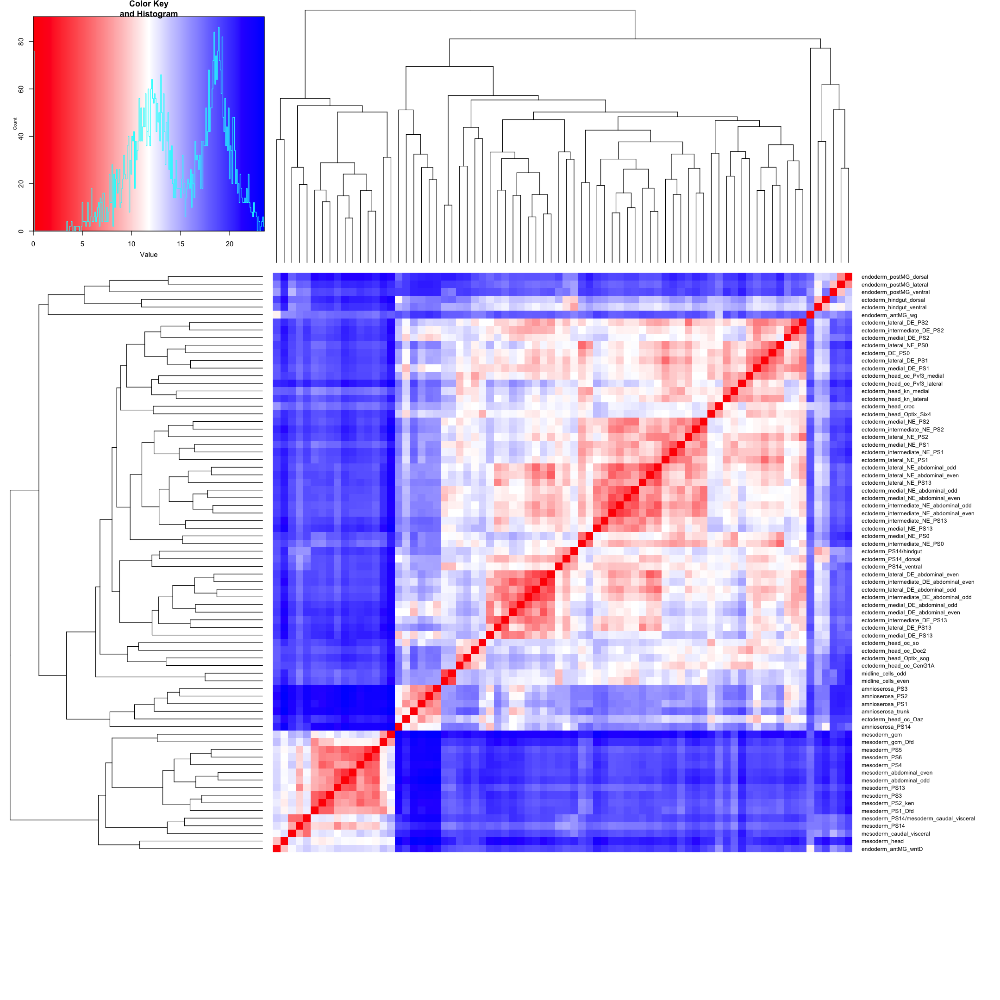

In [73]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_not_tfpm), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not_tfpm,  Rowv = dend_not_tfpm)

In [74]:
postscript("./figures/heatmap_258NotTFPM.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_not_tfpm), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not_tfpm,  Rowv = dend_not_tfpm)
dev.off()

pdf 
  2

### "others" in GLAD
#### All "others" genes in 1,500 HVGs

In [75]:
is.others <- glad.table['Modified_GLAD']=='others'
sum(is.others)
others.list <- glad.table[is.others,'BDGP_ref_symbol']
head(others.list)
length(unique(others.list))
others.in.vf <- vf.list[vf.list %in% others.list]
length(others.in.vf)

[1] 5084

[1] "CG34310-cup"       "RpL7-like-CG34164" "Adh-Adhr"         
[4] "LSm-4-CG17768"     "CG17139-CG17140"   "CG43739-sky"

[1] 5084

[1] 430

PC_ 1 
Positive:  Atx-1, Dl, crb, ASPP, E(spl)m4-BFM, Tet, Ptr, Tom, sdt, aay 
	   rho, sca, Brd, ec, jbug, Btk29A, CG5059, CG34383, E(spl)malpha-BFM, Mkp3 
	   cno, shg, dpp, mira, Ppa, CREG, uif, Alk, Thor, siz 
Negative:  hll, Cyp310a1, stg, Pka-C3, CG14688, Act87E, stumps, sty, CG11357, CG1673 
	   shep, kibra, tkv, CG43658, Asph, Fbxl7, GstT4, Mes4, Tis11, RhoL 
	   how, cnn, CG10663, ry, Ire1, GlcAT-P, Mid1, Imp-CR45204, fax, Fur1 
PC_ 2 
Positive:  sca, CG5059, stg, wech, Tet, Imp-CR45204, path, comm, fz2, ptc 
	   Dl, Brd, hh, nkd, jbug, rdx, Ppa, shg, tkv, neur 
	   Atg18a, Pen, N, Shroom, uif, crb, fz, how, Pka-C3, lok 
Negative:  ps, Pepck-CG45087, phu, aay, Thor, bru2, CG16758, CG8036, Tis11, l(3)02640 
	   CG3940, Rtnl1, CG10365, GstD5, Ald, CG32201, Bsg25D, Eip63E, GstD1, Diap1 
	   Sep5, sfl, Tl, GlcAT-P, CG30463, FER, for, CG10082, CG32199, CG4302 
PC_ 3 
Positive:  sca, Tet, aay, Dl, awd, ps, wg, Pepck-CG45087, Atx-1, hh 
	   RpL10, ATPsynC, RpL27A, rdx, siz, eEF1beta,

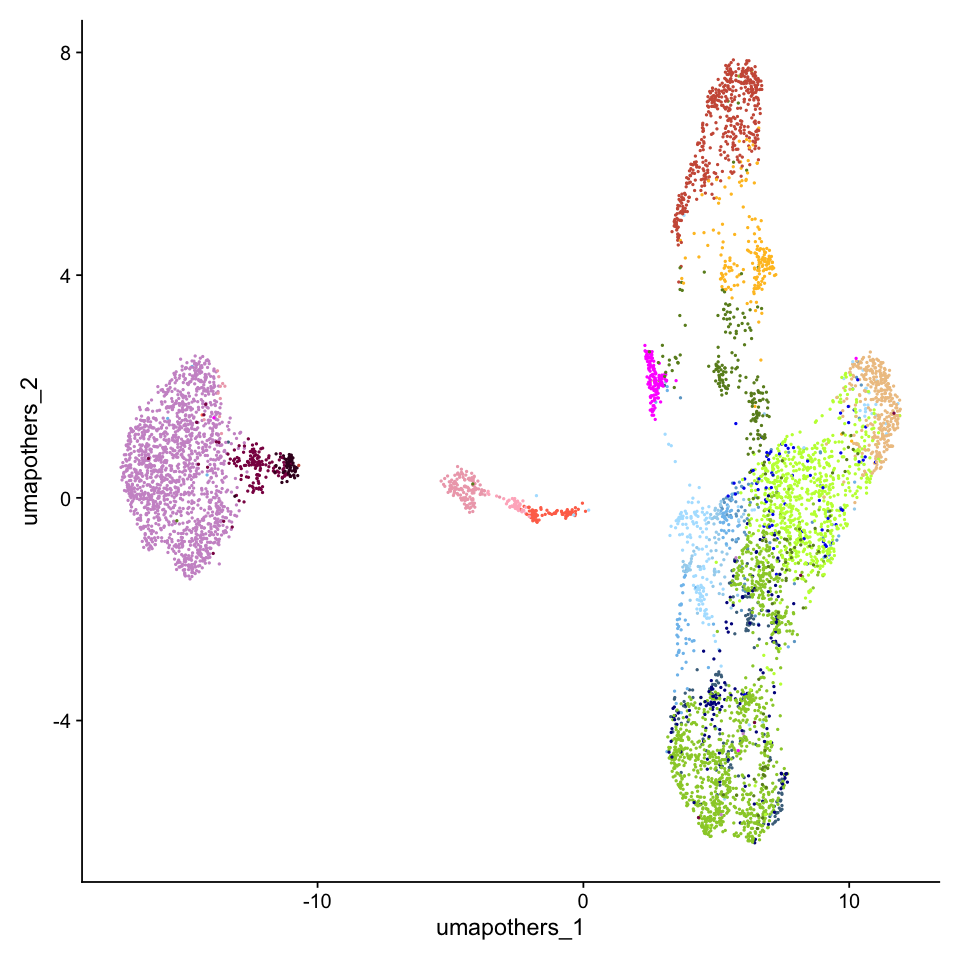

In [76]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = others.in.vf, reduction.name = 'pca.others')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.others', dims = 1:30,
                          reduction.name = 'umap.others')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.others', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_430others.eps', dpi = 300, width = 8, height = 8)

In [77]:
ave_SCT_others <- ave_SCT[others.in.vf,]
dim(ave_SCT_others)
dist_euc_log_others<- dist(as.matrix(log2(t(ave_SCT_others+1))), method = "euclidean")
clust_others <- hclust(dist_euc_log_others, "average")
dend_others <- as.dendrogram(clust_others)

[1] 430  76

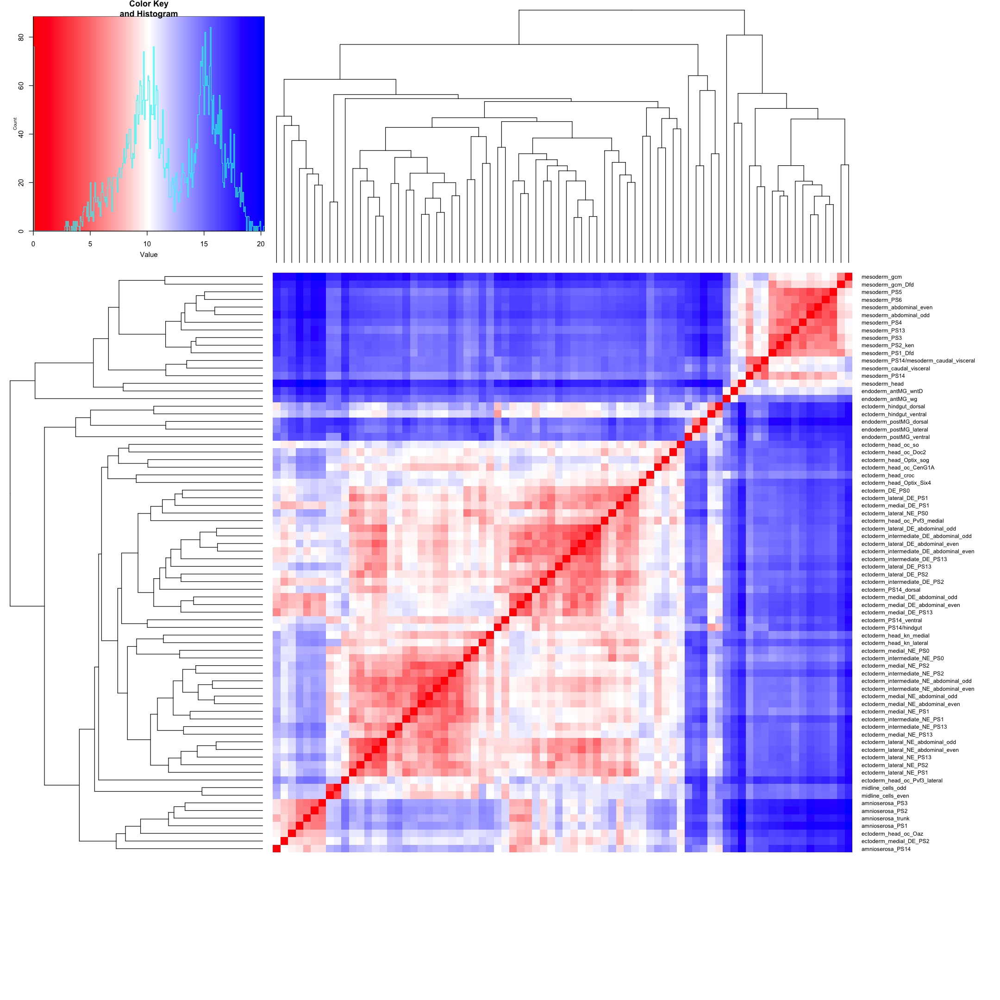

In [78]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_others), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_others,  Rowv = dend_others)

In [79]:
postscript("./figures/heatmap_430others.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_others), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_others,  Rowv = dend_others)
dev.off()

pdf 
  2

#### The same number as TFs

PC_ 1 
Positive:  hll, Cyp310a1, stg, Pka-C3, CG14688, Act87E, stumps, sty, CG11357, CG1673 
	   shep, kibra, tkv, CG43658, Asph, Fbxl7, GstT4, Mes4, Tis11, RhoL 
	   how, cnn, CG10663, ry, Ire1, GlcAT-P, Mid1, Imp-CR45204, fax, Fur1 
Negative:  Atx-1, Dl, crb, ASPP, E(spl)m4-BFM, Tet, Ptr, Tom, sdt, aay 
	   rho, sca, Brd, ec, jbug, Btk29A, CG5059, CG34383, E(spl)malpha-BFM, Mkp3 
	   cno, shg, mira, dpp, Ppa, CREG, uif, Alk, siz, Thor 
PC_ 2 
Positive:  sca, CG5059, Tet, wech, stg, Imp-CR45204, path, comm, Dl, fz2 
	   ptc, hh, jbug, Brd, rdx, nkd, Ppa, tkv, shg, neur 
	   Pen, Atg18a, Shroom, uif, N, crb, fz, how, lok, wg 
Negative:  ps, Pepck-CG45087, phu, aay, Thor, bru2, CG16758, Tis11, CG8036, CG3940 
	   l(3)02640, Rtnl1, CG10365, GstD5, Ald, Bsg25D, CG32201, Eip63E, Diap1, sfl 
	   Sep5, GstD1, Tl, GlcAT-P, scyl, CG30463, FER, rho, CG10082, for 
PC_ 3 
Positive:  sca, aay, Tet, ps, Dl, Pepck-CG45087, awd, wg, Atx-1, RpL10 
	   hh, Mkp3, RpL27A, bru2, CG2852, rdx, siz, RpL21, R

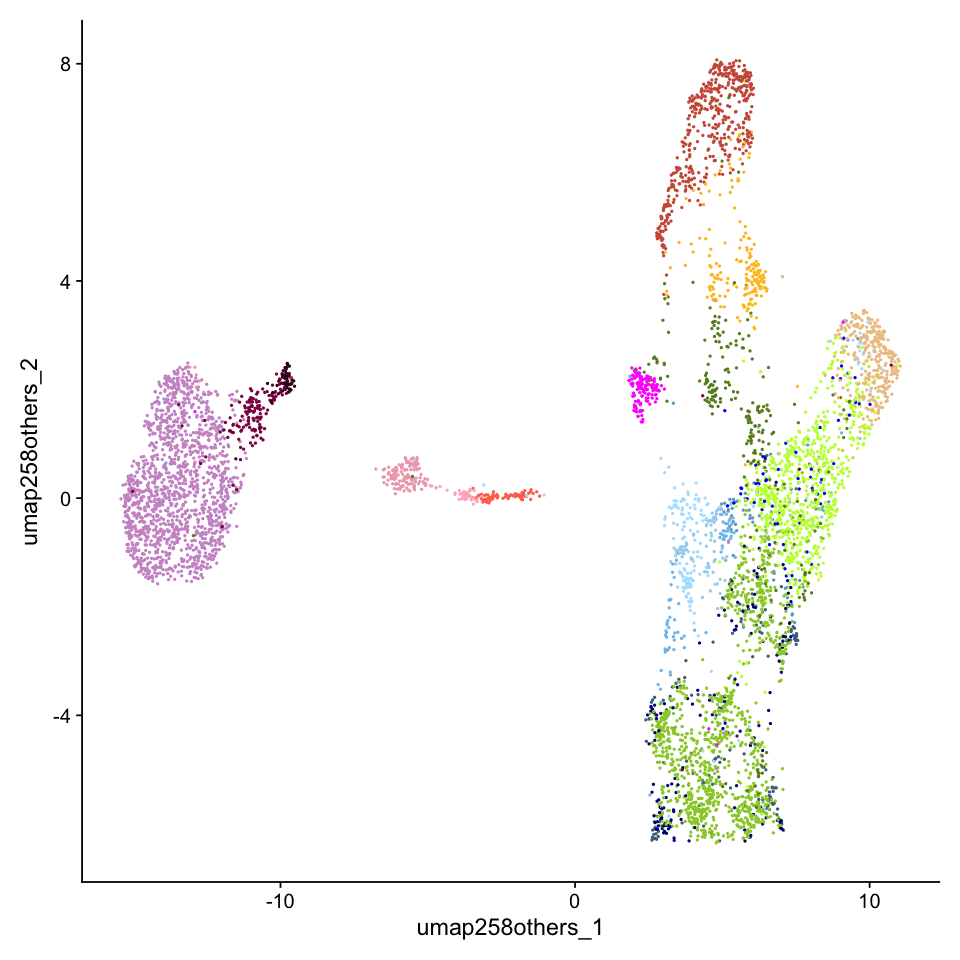

In [80]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = others.in.vf[1:258], reduction.name = 'pca.258others')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.258others', dims = 1:30,
                          reduction.name = 'umap.258others')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.258others', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_258others.eps', dpi = 300, width = 8, height = 8)

In [81]:
ave_SCT_others <- ave_SCT[others.in.vf[1:258],]
dim(ave_SCT_others)
dist_euc_log_others<- dist(as.matrix(log2(t(ave_SCT_others+1))), method = "euclidean")
clust_others <- hclust(dist_euc_log_others, "average")
dend_others <- as.dendrogram(clust_others)

[1] 258  76

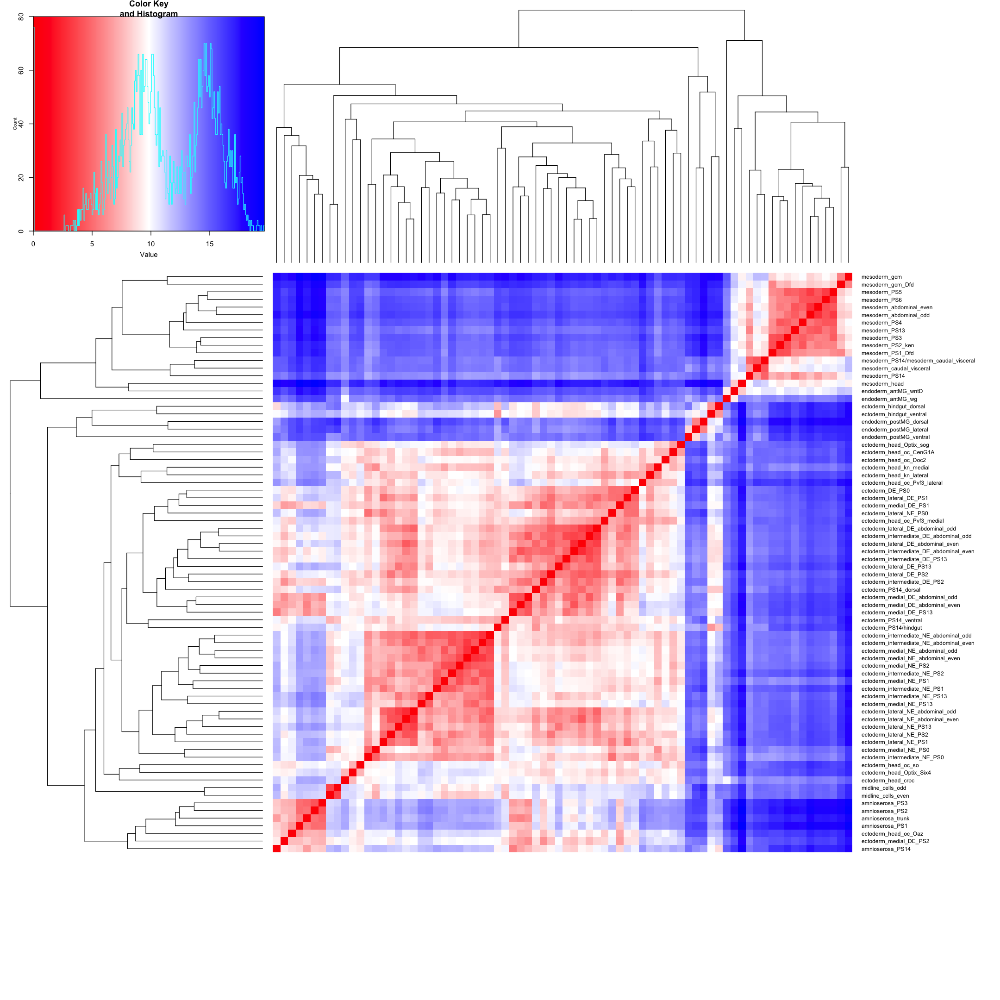

In [82]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_others), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_others,  Rowv = dend_others)

In [83]:
postscript("./figures/heatmap_258others.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_others), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_others,  Rowv = dend_others)
dev.off()

pdf 
  2

### Not in GLAD
#### All HVGs which are not in GLAD

In [84]:
is.not.in.glad <- glad.table['Modified_GLAD']=='Not in GLAD'
sum(is.not.in.glad)
not.in.glad.list <- glad.table[is.not.in.glad,'BDGP_ref_symbol']
head(not.in.glad.list)
length(unique(not.in.glad.list))
not.in.glad.in.vf <- vf.list[vf.list %in% not.in.glad.list]
length(not.in.glad.in.vf)

[1] 7952

[1] "SP555-CG14042"   "Edited00002"     "CG14933-CG42486" "CG43816-CG13245"
[5] "SclB-SclA"       "CG42635-CG42634"

[1] 7952

[1] 403

PC_ 1 
Positive:  CG13427, CG34224, Lac, CG15628, CG15480, CG4440, toc, yellow-e3, halo, Pino 
	   Z600, lncRNA:CR32218, Ocho, Trim9, Wdr62, Bacc, CG9821, BobA, CG43427, CG5191 
	   lncRNA:bxd, bbg, pri, lncRNA:CR45916, lncRNA:noe, lncRNA:CR43314, btsz, Rgl, CG10283, CG43085 
Negative:  sprt, VepD, Mes2, CG12177, Nplp2, CG7029, CycE, GEFmeso, Traf4, lncRNA:CR45361 
	   CG9005, pigs, Spn, CG44286-CG8788, CG42762, milt, CG10479, lncRNA:CR43432, CG14111, DNaseII 
	   lncRNA:CR33963, CG33099, kuk, cv-c, Dph1, Sirup, lncRNA:CR44206, CG43184, DIP-epsilon, CycB 
PC_ 2 
Positive:  sprt, pri, lncRNA:bxd, CG34224, dan, CG15628, pigs, VepD, CG12177, danr 
	   pico, lncRNA:CR45361, insv, CycE, CG15480, lncRNA:iab4, drongo, px, lncRNA:CR44931, CG17265 
	   link, Ocho, CG13465, CBP, Mes2, Traf4, Spn, RhoGAP71E, milt, lncRNA:Hsromega 
Negative:  Gmap, DNaseII, spri, cv-c, bnb, Nplp2, CG12643, CG14317, RapGAP1, CG13912 
	   a, CG7191, alpha-Est1, bbg, halo, CG13653, lncRNA:CR43126, CG42762, btsz, CG34

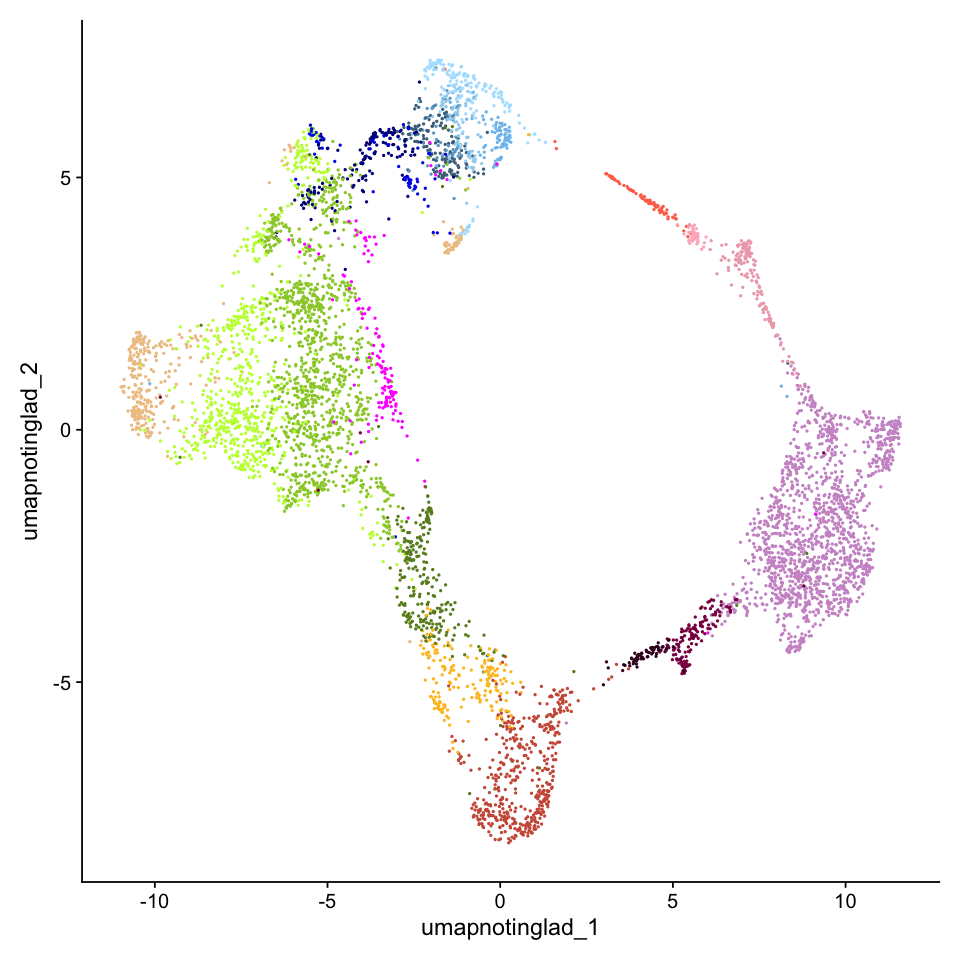

In [85]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = not.in.glad.in.vf, reduction.name = 'pca.notinglad')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.notinglad', dims = 1:30,
                          reduction.name = 'umap.notinglad')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.notinglad', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_403NotinGLAD.eps', dpi = 300, width = 8, height = 8)

In [86]:
ave_SCT_not.in.glad <- ave_SCT[not.in.glad.in.vf,]
dim(ave_SCT_not.in.glad)
dist_euc_log_not.in.glad<- dist(as.matrix(log2(t(ave_SCT_not.in.glad+1))), method = "euclidean")
clust_not.in.glad <- hclust(dist_euc_log_not.in.glad, "average")
dend_not.in.glad <- as.dendrogram(clust_not.in.glad)

[1] 403  76

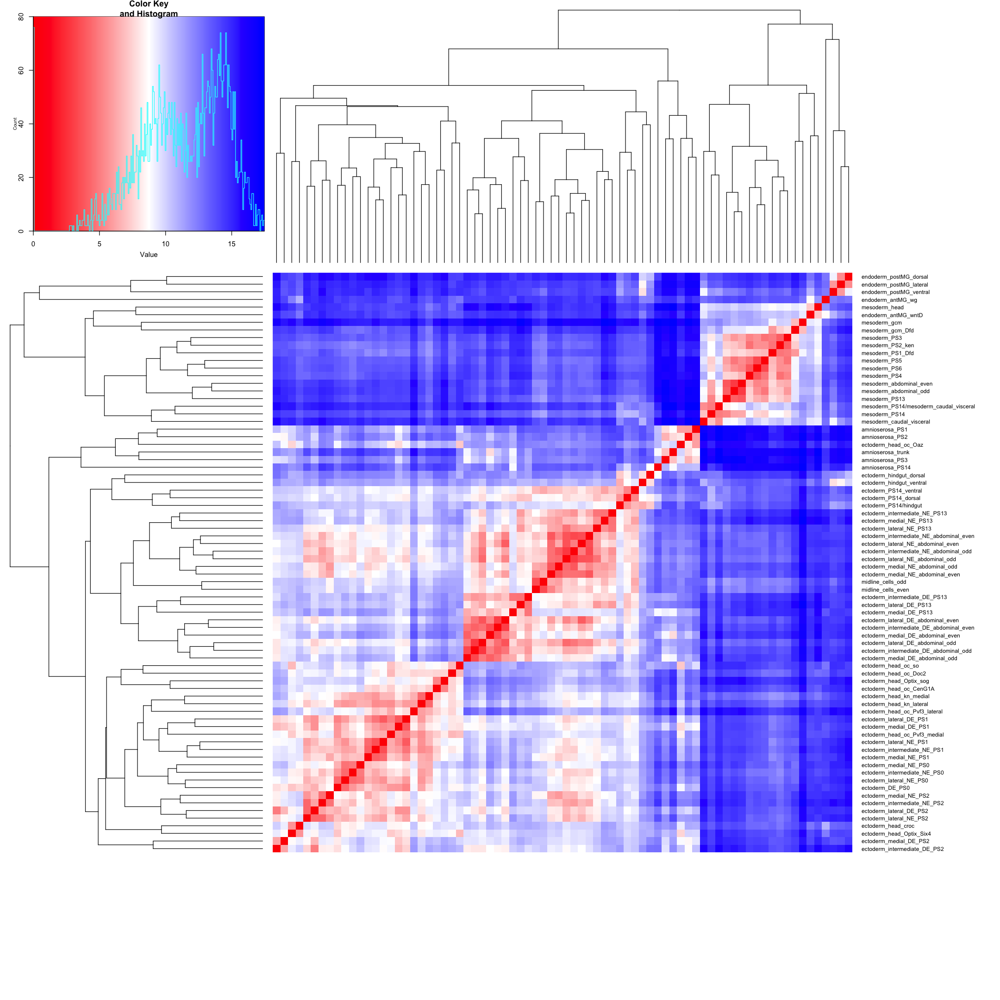

In [87]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_not.in.glad), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not.in.glad,  Rowv = dend_not.in.glad)

In [88]:
postscript("./figures/heatmap_403NotinGLAD.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_not.in.glad), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not.in.glad,  Rowv = dend_not.in.glad)
dev.off()

pdf 
  2

#### The same number as TFs

PC_ 1 
Positive:  CG13427, CG34224, Lac, CG15628, CG15480, CG4440, toc, yellow-e3, halo, Pino 
	   Z600, lncRNA:CR32218, Ocho, Trim9, Wdr62, Bacc, CG9821, BobA, CG43427, CG5191 
	   lncRNA:bxd, bbg, pri, lncRNA:CR45916, lncRNA:noe, lncRNA:CR43314, btsz, Rgl, CG10283, CG43085 
Negative:  sprt, VepD, Mes2, CG12177, Nplp2, CG7029, CycE, GEFmeso, Traf4, lncRNA:CR45361 
	   CG9005, pigs, Spn, CG44286-CG8788, CG42762, milt, CG10479, lncRNA:CR43432, CG14111, DNaseII 
	   lncRNA:CR33963, CG33099, kuk, cv-c, Dph1, Sirup, lncRNA:CR44206, CG43184, DIP-epsilon, lncRNA:Hsromega 
PC_ 2 
Positive:  sprt, pri, lncRNA:bxd, CG34224, dan, pigs, CG15628, VepD, CG12177, danr 
	   pico, lncRNA:CR45361, insv, CycE, CG15480, lncRNA:iab4, drongo, px, lncRNA:CR44931, CG17265 
	   link, Ocho, CBP, CG13465, Mes2, Traf4, Spn, RhoGAP71E, milt, lncRNA:Hsromega 
Negative:  Gmap, DNaseII, spri, cv-c, bnb, Nplp2, CG12643, CG14317, RapGAP1, CG13912 
	   a, CG7191, halo, alpha-Est1, bbg, CG13653, lncRNA:CR43126, CG42762,

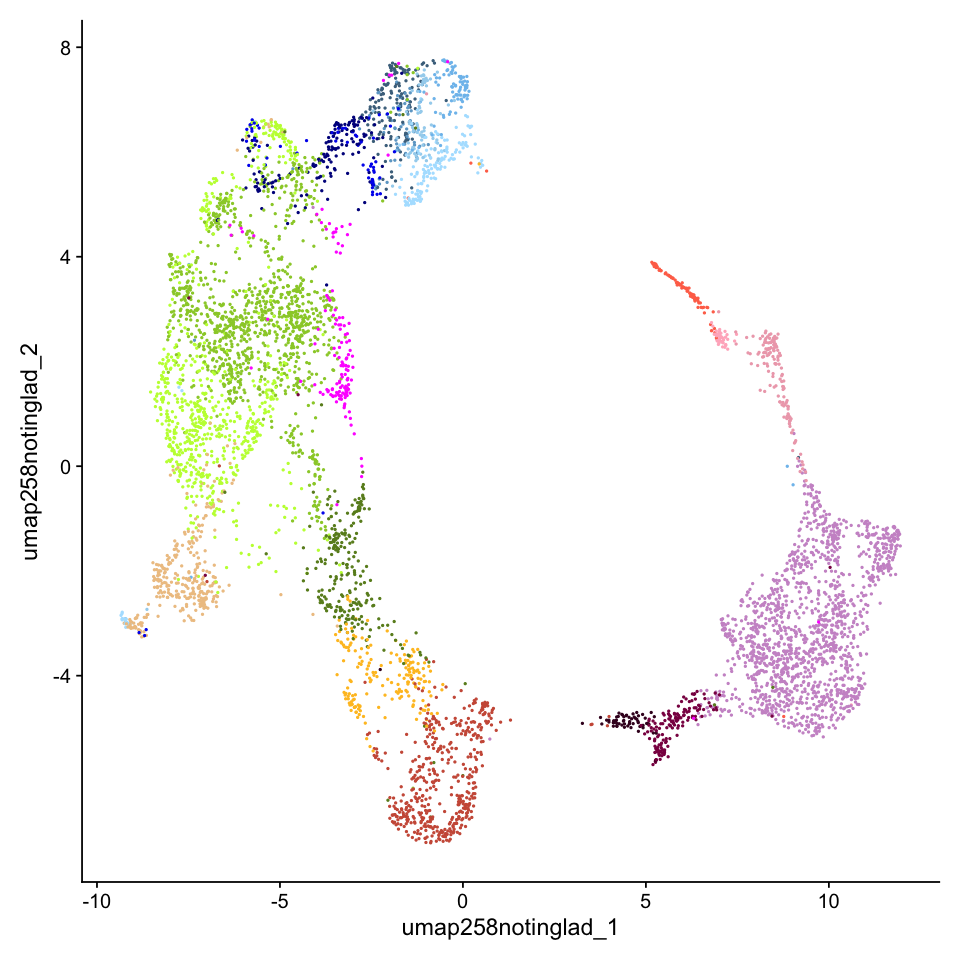

In [89]:
seu_HQC_VF1500 <- RunPCA(seu_HQC_VF1500, features = not.in.glad.in.vf[1:258], reduction.name = 'pca.258notinglad')
seu_HQC_VF1500 <- RunUMAP(seu_HQC_VF1500, reduction = 'pca.258notinglad', dims = 1:30,
                          reduction.name = 'umap.258notinglad')
options(repr.plot.width= 8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_VF1500, reduction = 'umap.258notinglad', cols = colors) + NoLegend()
fig
ggsave(fig, file = './figures/umap_258NotinGLAD.eps', dpi = 300, width = 8, height = 8)

In [90]:
ave_SCT_not.in.glad <- ave_SCT[not.in.glad.in.vf[1:258],]
dim(ave_SCT_not.in.glad)
dist_euc_log_not.in.glad<- dist(as.matrix(log2(t(ave_SCT_not.in.glad+1))), method = "euclidean")
clust_not.in.glad <- hclust(dist_euc_log_not.in.glad, "average")
dend_not.in.glad <- as.dendrogram(clust_not.in.glad)

[1] 258  76

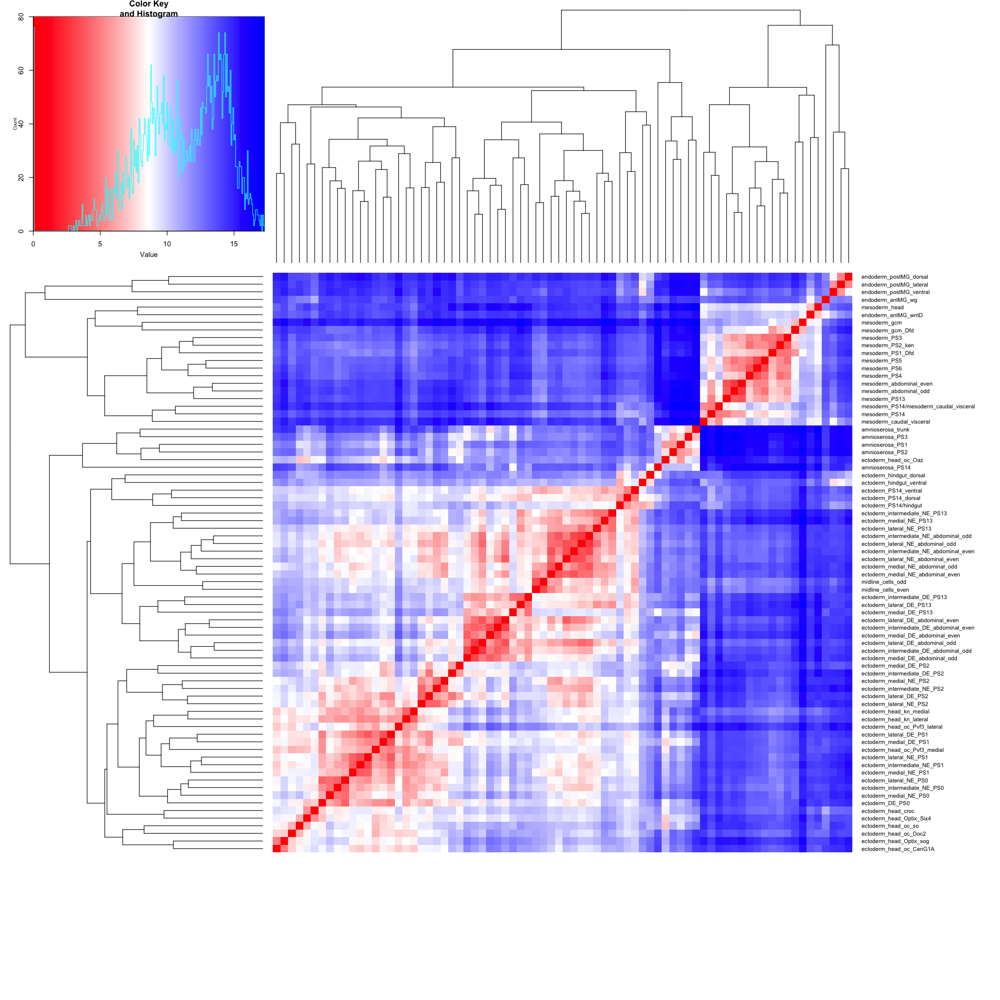

In [91]:
options(repr.plot.width=18, repr.plot.height=18)
heatmap.2(as.matrix(dist_euc_log_not.in.glad), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not.in.glad,  Rowv = dend_not.in.glad)

In [92]:
postscript("./figures/heatmap_258NotinGLAD.eps", width = 8, height = 8, pointsize = 6, horizontal = FALSE)
heatmap.2(as.matrix(dist_euc_log_not.in.glad), col=redblue(256), trace="none", margins=c(16,16), labCol=NA, Colv = dend_not.in.glad,  Rowv = dend_not.in.glad)
dev.off()

pdf 
  2

In [93]:
saveRDS(seu_HQC_VF1500, file = '../../data/seurat_object/Set3/seu_HQC_1500HVGs.obj')